# Frequency Analysis and Restoration

References:
1. Dabov, Kostadin, et al. "Image denoising by sparse 3-D transform-domain collaborative
filtering." IEEE Transactions on image processing 16.8 (2007): 2080-2095.
2. He, Kaiming, Jian Sun, and Xiaoou Tang. "Guided image filtering." European conference on
computer vision. Springer, Berlin, Heidelberg, 2010.

**Requirements**: The requirements of each assignment of this course at least include a) full document in PDF/Word format with implementation details and difficulties you met, 2) source code and the compiled file (in exe/dmg/sh) and its readme to indicate how to lunch it, and 3) key comments in your source code. If your code was referred from an existing source on the Internet, please cite it accordingly.

## 0.Image Reading



In [ ]:
!pip install rawpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 18.9 MB/s 


In [ ]:
import numpy as np
import rawpy
import cv2
from matplotlib import pyplot as plt
import matplotlib.pyplot as pyplot
import ipywidgets as widgets
import scipy as sp
import imageio
from skimage import io
from PIL import Image

###Lena

ok


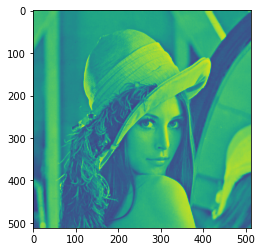

In [ ]:
rows=512
cols=512
#read raw format image with function 'fromfile' from numpy，assign the data type
img_l=np.fromfile(r'/content/lena.raw', dtype='uint8')
# read raw format image with function 'reshape' for array from numpy to rearrange the data
img_l=img_l.reshape(rows, cols)
# show image
pyplot.imshow(img_l)

# turn uint16 into uint8.
cv2.waitKey()
cv2.destroyAllWindows()
print('ok')

In [ ]:
img_l.shape = (512,512)
print(img_l.shape)
raw_l=img_l.astype(np.uint8)#Convert rawfile type from float32 into int8
print(raw_l.dtype)
imageio.imwrite("lena.png", raw_l)

(512, 512)
uint8


###F16

ok


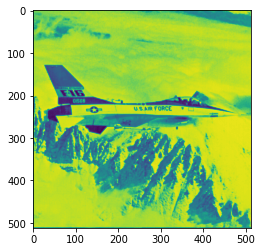

In [ ]:
rows=512
cols=512
#read raw format image with function 'fromfile' from numpy，assign the data type
img_16=np.fromfile(r'/content/F16.raw', dtype='uint8')
# read raw format image with function 'reshape' for array from numpy to rearrange the data
img_16=img_16.reshape(rows, cols)
# show image
pyplot.imshow(img_16)

# turn uint16 into uint8.
cv2.waitKey()
cv2.destroyAllWindows()
print('ok')

In [ ]:
img_16.shape = (512,512)
print(img_16.shape)
raw_16=img_16.astype(np.uint8)#Convert rawfile type from float32 into int8
print(raw_16.dtype)
imageio.imwrite("F16.png", raw_16)

(512, 512)
uint8


###Baboon

ok


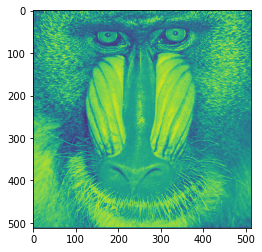

In [ ]:
rows=512
cols=512
#read raw format image with function 'fromfile' from numpy，assign the data type
img_16=np.fromfile(r'/content/baboon.raw', dtype='uint8')
# read raw format image with function 'reshape' for array from numpy to rearrange the data
img_16=img_16.reshape(rows, cols)
# show image
pyplot.imshow(img_16)

# turn uint16 into uint8.
cv2.waitKey()
cv2.destroyAllWindows()
print('ok')

In [ ]:
img_16.shape = (512,512)
print(img_16.shape)
raw_16=img_16.astype(np.uint8)#Convert rawfile type from float32 into int8
print(raw_16.dtype)
imageio.imwrite("baboon.png", raw_16)

(512, 512)
uint8


###Noisy

ok


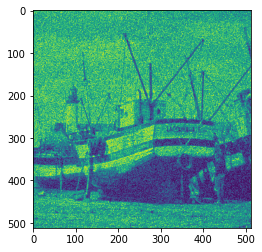

In [ ]:
rows=512
cols=512
#read raw format image with function 'fromfile' from numpy，assign the data type
img_16=np.fromfile(r'/content/Noisy.raw', dtype='uint8')
# read raw format image with function 'reshape' for array from numpy to rearrange the data
img_16=img_16.reshape(rows, cols)
# show image
pyplot.imshow(img_16)

# turn uint16 into uint8.
cv2.waitKey()
cv2.destroyAllWindows()
print('ok')

In [ ]:
img_16.shape = (512,512)
print(img_16.shape)
raw_16=img_16.astype(np.uint8)#Convert rawfile type from float32 into int8
print(raw_16.dtype)
imageio.imwrite("Noisy.png", raw_16)

(512, 512)
uint8


## 1.Fourier Transform

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imshow
from skimage import color, exposure, transform
from skimage.exposure import equalize_hist

###i. Based on DFT,  draw the frequency response without shifting, where the lower frequency will be located at four corners.


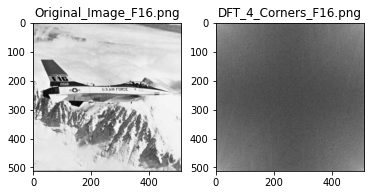

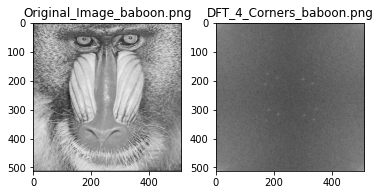

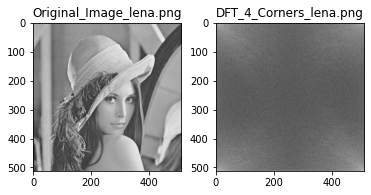

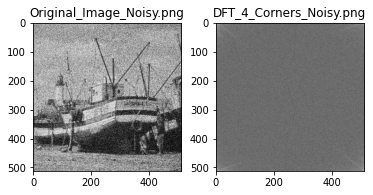

In [ ]:
for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:
                
        # Read image
        img = np.array(Image.open(name).convert('L'), dtype = 'uint8') 

        fig, ax = plt.subplots(1,2,figsize=(6,6))

        plt.subplot(221)
        plt.axis('on')
        plt.title('Original_Image_'+name)
        plt.imshow(img,cmap='gray')

        dft = cv2.dft(np.float32(img),flags=cv2.DFT_COMPLEX_OUTPUT)
        plt.subplot(222)
        plt.axis('on')
        plt.title('DFT_4_Corners_'+name)
        plt.imshow(20*np.log(cv2.magnitude(dft[:,:,0],dft[:,:,1])),cmap='gray')
        
        plt.show()

###ii. Please show the centralized result based on (i).


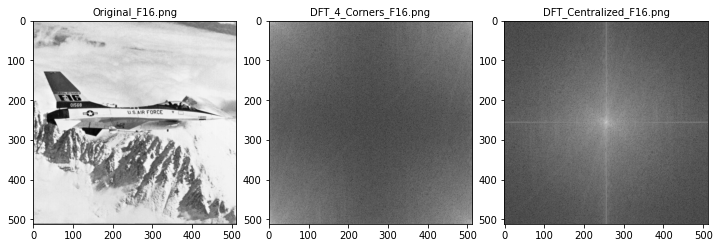

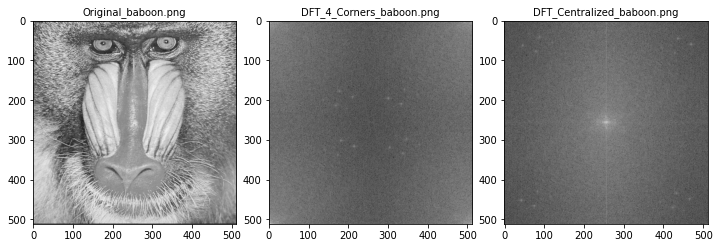

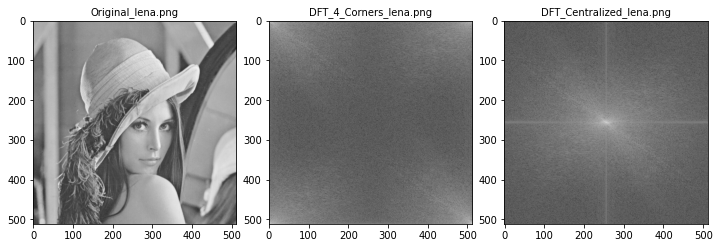

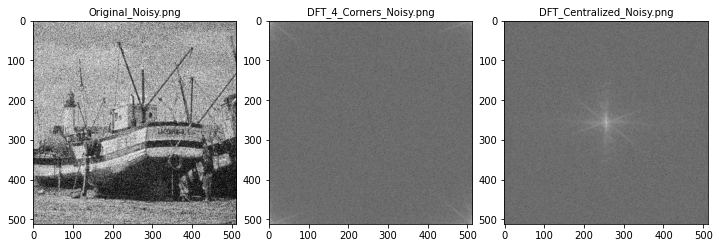

In [ ]:
for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:
               
        # Read image
        img = np.array(Image.open(name).convert('L'), dtype = 'uint8') 
        fig, ax = plt.subplots(1,3,figsize=(10,10))

        plt.subplot(331)
        plt.axis('on')
        plt.title('Original_'+name, size=10)
        plt.imshow(img,cmap='gray')

        dft = cv2.dft(np.float32(img),flags=cv2.DFT_COMPLEX_OUTPUT)
        plt.subplot(332)
        plt.axis('on')
        plt.title('DFT_4_Corners_'+name, size=10)
        plt.imshow(20*np.log(cv2.magnitude(dft[:,:,0],dft[:,:,1])),cmap='gray')
        
        dft_shift = np.fft.fftshift(dft)
        plt.subplot(333)
        plt.axis('on')
        plt.title('DFT_Centralized_'+name, size=10)
        plt.imshow(20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1])),cmap='gray')
        
        fig.tight_layout()
        plt.show()

###iii. Plot the histogram of the spectrum

In [ ]:
def DFT(x):
    """
    Function to calculate the 
    discrete Fourier Transform 
    of a 1D real-valued signal x
    """

    N = len(x)
    n = np.arange(N)
    k = n.reshape((N, 1))
    e = np.exp(-2j * np.pi * k * n / N)
    
    X = np.dot(e, x)
    
    return X

In [ ]:
__all__ = ['img_as_float32', 'img_as_float64', 'img_as_float',
           'img_as_int', 'img_as_uint', 'img_as_ubyte',
           'img_as_bool', 'dtype_limits']

# For integers Numpy uses `_integer_types` basis internally, and builds a leaky
# `np.XintYY` abstraction on top of it. This leads to situations when, for
# example, there are two np.Xint64 dtypes with the same attributes but
# different object references. In order to avoid any potential issues,
# we use the basis dtypes here. For more information, see:
# - https://github.com/scikit-image/scikit-image/issues/3043
# For convenience, for these dtypes we indicate also the possible bit depths
# (some of them are platform specific). For the details, see:
# http://www.unix.org/whitepapers/64bit.html
_integer_types = (np.byte, np.ubyte,          # 8 bits
                  np.short, np.ushort,        # 16 bits
                  np.intc, np.uintc,          # 16 or 32 or 64 bits
                  int, np.int_, np.uint,      # 32 or 64 bits
                  np.longlong, np.ulonglong)  # 64 bits
_integer_ranges = {t: (np.iinfo(t).min, np.iinfo(t).max)
                   for t in _integer_types}
dtype_range = {bool: (False, True),
               np.bool_: (False, True),
               np.bool8: (False, True),
               float: (-1, 1),
               np.float_: (-1, 1),
               np.float16: (-1, 1),
               np.float32: (-1, 1),
               np.float64: (-1, 1)}
dtype_range.update(_integer_ranges)

_supported_types = list(dtype_range.keys())


def dtype_limits(image, clip_negative=False):
    """Return intensity limits, i.e. (min, max) tuple, of the image's dtype.

    Parameters
    ----------
    image : ndarray
        Input image.
    clip_negative : bool, optional
        If True, clip the negative range (i.e. return 0 for min intensity)
        even if the image dtype allows negative values.

    Returns
    -------
    imin, imax : tuple
        Lower and upper intensity limits.
    """
    imin, imax = dtype_range[image.dtype.type]
    if clip_negative:
        imin = 0
    return imin, imax


def _dtype_itemsize(itemsize, *dtypes):
    """Return first of `dtypes` with itemsize greater than `itemsize`

    Parameters
    ----------
    itemsize: int
        The data type object element size.

    Other Parameters
    ----------------
    *dtypes:
        Any Object accepted by `np.dtype` to be converted to a data
        type object

    Returns
    -------
    dtype: data type object
        First of `dtypes` with itemsize greater than `itemsize`.

    """
    return next(dt for dt in dtypes if np.dtype(dt).itemsize >= itemsize)


def _dtype_bits(kind, bits, itemsize=1):
    """Return dtype of `kind` that can store a `bits` wide unsigned int

    Parameters:
    kind: str
        Data type kind.
    bits: int
        Desired number of bits.
    itemsize: int
        The data type object element size.

    Returns
    -------
    dtype: data type object
        Data type of `kind` that can store a `bits` wide unsigned int

    """

    s = next(i for i in (itemsize, ) + (2, 4, 8) if
             bits < (i * 8) or (bits == (i * 8) and kind == 'u'))

    return np.dtype(kind + str(s))


def _scale(a, n, m, copy=True):
    """Scale an array of unsigned/positive integers from `n` to `m` bits.

    Numbers can be represented exactly only if `m` is a multiple of `n`.

    Parameters
    ----------
    a : ndarray
        Input image array.
    n : int
        Number of bits currently used to encode the values in `a`.
    m : int
        Desired number of bits to encode the values in `out`.
    copy : bool, optional
        If True, allocates and returns new array. Otherwise, modifies
        `a` in place.

    Returns
    -------
    out : array
        Output image array. Has the same kind as `a`.
    """
    kind = a.dtype.kind
    if n > m and a.max() < 2 ** m:
        mnew = int(np.ceil(m / 2) * 2)
        if mnew > m:
            dtype = f'int{mnew}'
        else:
            dtype = f'uint{mnew}'
        n = int(np.ceil(n / 2) * 2)
        warn(f'Downcasting {a.dtype} to {dtype} without scaling because max '
             f'value {a.max()} fits in {dtype}',
             stacklevel=3)
        return a.astype(_dtype_bits(kind, m))
    elif n == m:
        return a.copy() if copy else a
    elif n > m:
        # downscale with precision loss
        if copy:
            b = np.empty(a.shape, _dtype_bits(kind, m))
            np.floor_divide(a, 2**(n - m), out=b, dtype=a.dtype,
                            casting='unsafe')
            return b
        else:
            a //= 2**(n - m)
            return a
    elif m % n == 0:
        # exact upscale to a multiple of `n` bits
        if copy:
            b = np.empty(a.shape, _dtype_bits(kind, m))
            np.multiply(a, (2**m - 1) // (2**n - 1), out=b, dtype=b.dtype)
            return b
        else:
            a = a.astype(_dtype_bits(kind, m, a.dtype.itemsize), copy=False)
            a *= (2**m - 1) // (2**n - 1)
            return a
    else:
        # upscale to a multiple of `n` bits,
        # then downscale with precision loss
        o = (m // n + 1) * n
        if copy:
            b = np.empty(a.shape, _dtype_bits(kind, o))
            np.multiply(a, (2**o - 1) // (2**n - 1), out=b, dtype=b.dtype)
            b //= 2**(o - m)
            return b
        else:
            a = a.astype(_dtype_bits(kind, o, a.dtype.itemsize), copy=False)
            a *= (2**o - 1) // (2**n - 1)
            a //= 2**(o - m)
            return a


def _convert(image, dtype, force_copy=False, uniform=False):
    """
    Convert an image to the requested data-type.

    Warnings are issued in case of precision loss, or when negative values
    are clipped during conversion to unsigned integer types (sign loss).

    Floating point values are expected to be normalized and will be clipped
    to the range [0.0, 1.0] or [-1.0, 1.0] when converting to unsigned or
    signed integers respectively.

    Numbers are not shifted to the negative side when converting from
    unsigned to signed integer types. Negative values will be clipped when
    converting to unsigned integers.

    Parameters
    ----------
    image : ndarray
        Input image.
    dtype : dtype
        Target data-type.
    force_copy : bool, optional
        Force a copy of the data, irrespective of its current dtype.
    uniform : bool, optional
        Uniformly quantize the floating point range to the integer range.
        By default (uniform=False) floating point values are scaled and
        rounded to the nearest integers, which minimizes back and forth
        conversion errors.

    .. versionchanged:: 0.15
        ``_convert`` no longer warns about possible precision or sign
        information loss. See discussions on these warnings at:
        https://github.com/scikit-image/scikit-image/issues/2602
        https://github.com/scikit-image/scikit-image/issues/543#issuecomment-208202228
        https://github.com/scikit-image/scikit-image/pull/3575

    References
    ----------
    .. [1] DirectX data conversion rules.
           https://msdn.microsoft.com/en-us/library/windows/desktop/dd607323%28v=vs.85%29.aspx
    .. [2] Data Conversions. In "OpenGL ES 2.0 Specification v2.0.25",
           pp 7-8. Khronos Group, 2010.
    .. [3] Proper treatment of pixels as integers. A.W. Paeth.
           In "Graphics Gems I", pp 249-256. Morgan Kaufmann, 1990.
    .. [4] Dirty Pixels. J. Blinn. In "Jim Blinn's corner: Dirty Pixels",
           pp 47-57. Morgan Kaufmann, 1998.

    """
    image = np.asarray(image)
    dtypeobj_in = image.dtype
    if dtype is np.floating:
        dtypeobj_out = np.dtype('float64')
    else:
        dtypeobj_out = np.dtype(dtype)
    dtype_in = dtypeobj_in.type
    dtype_out = dtypeobj_out.type
    kind_in = dtypeobj_in.kind
    kind_out = dtypeobj_out.kind
    itemsize_in = dtypeobj_in.itemsize
    itemsize_out = dtypeobj_out.itemsize

    # Below, we do an `issubdtype` check.  Its purpose is to find out
    # whether we can get away without doing any image conversion.  This happens
    # when:
    #
    # - the output and input dtypes are the same or
    # - when the output is specified as a type, and the input dtype
    #   is a subclass of that type (e.g. `np.floating` will allow
    #   `float32` and `float64` arrays through)

    if np.issubdtype(dtype_in, np.obj2sctype(dtype)):
        if force_copy:
            image = image.copy()
        return image

    if not (dtype_in in _supported_types and dtype_out in _supported_types):
        raise ValueError(f'Cannot convert from {dtypeobj_in} to '
                         f'{dtypeobj_out}.')

    if kind_in in 'ui':
        imin_in = np.iinfo(dtype_in).min
        imax_in = np.iinfo(dtype_in).max
    if kind_out in 'ui':
        imin_out = np.iinfo(dtype_out).min
        imax_out = np.iinfo(dtype_out).max

    # any -> binary
    if kind_out == 'b':
        return image > dtype_in(dtype_range[dtype_in][1] / 2)

    # binary -> any
    if kind_in == 'b':
        result = image.astype(dtype_out)
        if kind_out != 'f':
            result *= dtype_out(dtype_range[dtype_out][1])
        return result

    # float -> any
    if kind_in == 'f':
        if kind_out == 'f':
            # float -> float
            return image.astype(dtype_out)

        if np.min(image) < -1.0 or np.max(image) > 1.0:
            raise ValueError("Images of type float must be between -1 and 1.")
        # floating point -> integer
        # use float type that can represent output integer type
        computation_type = _dtype_itemsize(itemsize_out, dtype_in,
                                           np.float32, np.float64)

        if not uniform:
            if kind_out == 'u':
                image_out = np.multiply(image, imax_out,
                                        dtype=computation_type)
            else:
                image_out = np.multiply(image, (imax_out - imin_out) / 2,
                                        dtype=computation_type)
                image_out -= 1.0 / 2.
            np.rint(image_out, out=image_out)
            np.clip(image_out, imin_out, imax_out, out=image_out)
        elif kind_out == 'u':
            image_out = np.multiply(image, imax_out + 1,
                                    dtype=computation_type)
            np.clip(image_out, 0, imax_out, out=image_out)
        else:
            image_out = np.multiply(image, (imax_out - imin_out + 1.0) / 2.0,
                                    dtype=computation_type)
            np.floor(image_out, out=image_out)
            np.clip(image_out, imin_out, imax_out, out=image_out)
        return image_out.astype(dtype_out)

    # signed/unsigned int -> float
    if kind_out == 'f':
        # use float type that can exactly represent input integers
        computation_type = _dtype_itemsize(itemsize_in, dtype_out,
                                           np.float32, np.float64)

        if kind_in == 'u':
            # using np.divide or np.multiply doesn't copy the data
            # until the computation time
            image = np.multiply(image, 1. / imax_in,
                                dtype=computation_type)
            # DirectX uses this conversion also for signed ints
            # if imin_in:
            #     np.maximum(image, -1.0, out=image)
        elif kind_in == 'i':
            # From DirectX conversions:
            # The most negative value maps to -1.0f
            # Every other value is converted to a float (call it c)
            # and then result = c * (1.0f / (2⁽ⁿ⁻¹⁾-1)).

            image = np.multiply(image, 1. / imax_in,
                                dtype=computation_type)
            np.maximum(image, -1.0, out=image)

        else:
            image = np.add(image, 0.5, dtype=computation_type)
            image *= 2 / (imax_in - imin_in)

        return np.asarray(image, dtype_out)

    # unsigned int -> signed/unsigned int
    if kind_in == 'u':
        if kind_out == 'i':
            # unsigned int -> signed int
            image = _scale(image, 8 * itemsize_in, 8 * itemsize_out - 1)
            return image.view(dtype_out)
        else:
            # unsigned int -> unsigned int
            return _scale(image, 8 * itemsize_in, 8 * itemsize_out)

    # signed int -> unsigned int
    if kind_out == 'u':
        image = _scale(image, 8 * itemsize_in - 1, 8 * itemsize_out)
        result = np.empty(image.shape, dtype_out)
        np.maximum(image, 0, out=result, dtype=image.dtype, casting='unsafe')
        return result

    # signed int -> signed int
    if itemsize_in > itemsize_out:
        return _scale(image, 8 * itemsize_in - 1, 8 * itemsize_out - 1)

    image = image.astype(_dtype_bits('i', itemsize_out * 8))
    image -= imin_in
    image = _scale(image, 8 * itemsize_in, 8 * itemsize_out, copy=False)
    image += imin_out
    return image.astype(dtype_out)


def convert(image, dtype, force_copy=False, uniform=False):
    warn("The use of this function is discouraged as its behavior may change "
         "dramatically in scikit-image 1.0. This function will be removed "
         "in scikit-image 1.0.", FutureWarning, stacklevel=2)
    return _convert(image=image, dtype=dtype,
                    force_copy=force_copy, uniform=uniform)


if _convert.__doc__ is not None:
    convert.__doc__ = _convert.__doc__ + """

    Warns
    -----
    FutureWarning:
        .. versionadded:: 0.17

        The use of this function is discouraged as its behavior may change
        dramatically in scikit-image 1.0. This function will be removed
        in scikit-image 1.0.
    """


def img_as_float32(image, force_copy=False):
    """Convert an image to single-precision (32-bit) floating point format.

    Parameters
    ----------
    image : ndarray
        Input image.
    force_copy : bool, optional
        Force a copy of the data, irrespective of its current dtype.

    Returns
    -------
    out : ndarray of float32
        Output image.

    Notes
    -----
    The range of a floating point image is [0.0, 1.0] or [-1.0, 1.0] when
    converting from unsigned or signed datatypes, respectively.
    If the input image has a float type, intensity values are not modified
    and can be outside the ranges [0.0, 1.0] or [-1.0, 1.0].

    """
    return _convert(image, np.float32, force_copy)


def img_as_float64(image, force_copy=False):
    """Convert an image to double-precision (64-bit) floating point format.

    Parameters
    ----------
    image : ndarray
        Input image.
    force_copy : bool, optional
        Force a copy of the data, irrespective of its current dtype.

    Returns
    -------
    out : ndarray of float64
        Output image.

    Notes
    -----
    The range of a floating point image is [0.0, 1.0] or [-1.0, 1.0] when
    converting from unsigned or signed datatypes, respectively.
    If the input image has a float type, intensity values are not modified
    and can be outside the ranges [0.0, 1.0] or [-1.0, 1.0].

    """
    return _convert(image, np.float64, force_copy)


def img_as_float(image, force_copy=False):
    """Convert an image to floating point format.

    This function is similar to `img_as_float64`, but will not convert
    lower-precision floating point arrays to `float64`.

    Parameters
    ----------
    image : ndarray
        Input image.
    force_copy : bool, optional
        Force a copy of the data, irrespective of its current dtype.

    Returns
    -------
    out : ndarray of float
        Output image.

    Notes
    -----
    The range of a floating point image is [0.0, 1.0] or [-1.0, 1.0] when
    converting from unsigned or signed datatypes, respectively.
    If the input image has a float type, intensity values are not modified
    and can be outside the ranges [0.0, 1.0] or [-1.0, 1.0].

    """
    return _convert(image, np.floating, force_copy)


def img_as_uint(image, force_copy=False):
    """Convert an image to 16-bit unsigned integer format.

    Parameters
    ----------
    image : ndarray
        Input image.
    force_copy : bool, optional
        Force a copy of the data, irrespective of its current dtype.

    Returns
    -------
    out : ndarray of uint16
        Output image.

    Notes
    -----
    Negative input values will be clipped.
    Positive values are scaled between 0 and 65535.

    """
    return _convert(image, np.uint16, force_copy)


def img_as_int(image, force_copy=False):
    """Convert an image to 16-bit signed integer format.

    Parameters
    ----------
    image : ndarray
        Input image.
    force_copy : bool, optional
        Force a copy of the data, irrespective of its current dtype.

    Returns
    -------
    out : ndarray of int16
        Output image.

    Notes
    -----
    The values are scaled between -32768 and 32767.
    If the input data-type is positive-only (e.g., uint8), then
    the output image will still only have positive values.

    """
    return _convert(image, np.int16, force_copy)


def img_as_ubyte(image, force_copy=False):
    """Convert an image to 8-bit unsigned integer format.

    Parameters
    ----------
    image : ndarray
        Input image.
    force_copy : bool, optional
        Force a copy of the data, irrespective of its current dtype.

    Returns
    -------
    out : ndarray of ubyte (uint8)
        Output image.

    Notes
    -----
    Negative input values will be clipped.
    Positive values are scaled between 0 and 255.

    """
    return _convert(image, np.uint8, force_copy)


def img_as_bool(image, force_copy=False):
    """Convert an image to boolean format.

    Parameters
    ----------
    image : ndarray
        Input image.
    force_copy : bool, optional
        Force a copy of the data, irrespective of its current dtype.

    Returns
    -------
    out : ndarray of bool (`bool_`)
        Output image.

    Notes
    -----
    The upper half of the input dtype's positive range is True, and the lower
    half is False. All negative values (if present) are False.

    """
    return _convert(image, bool, force_copy)

<ipython-input-48-b67894171c1d>:34: ComplexWarning: Casting complex values to real discards the imaginary part
  im2 = np.array(DFT(img), dtype = 'uint8')


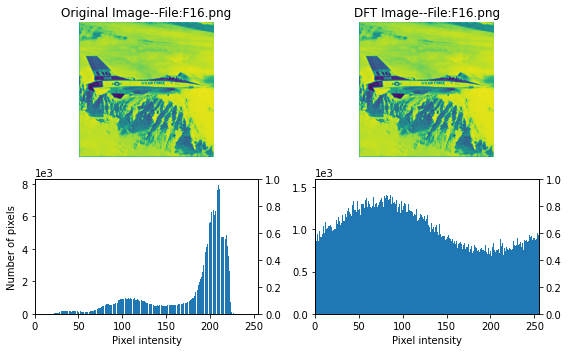

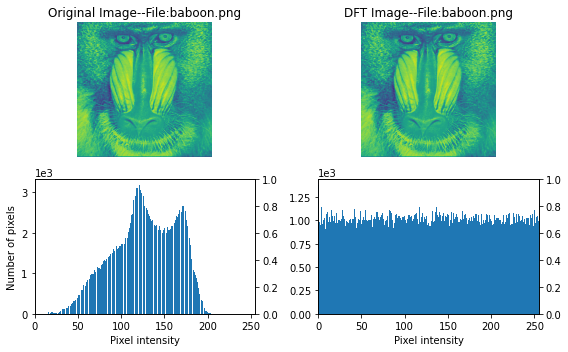

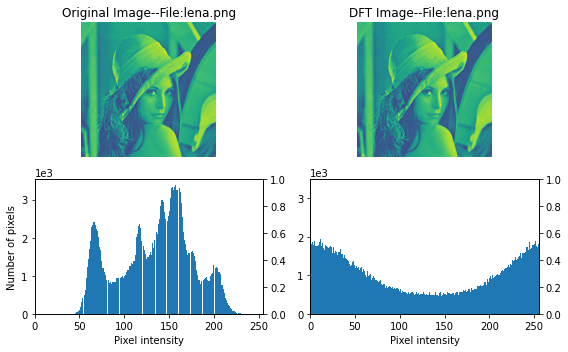

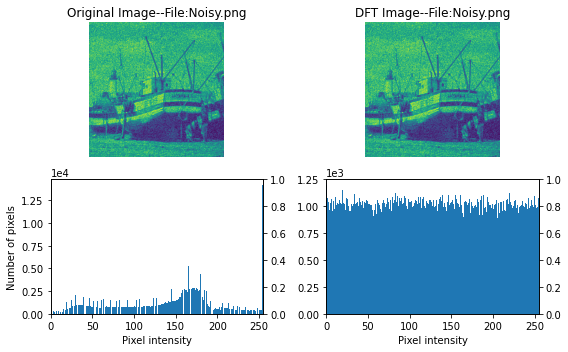

In [ ]:
import matplotlib

#original
def plot_img_and_hist(image, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(img)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins)
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')

    xmin, xmax = dtype_range[image.dtype.type]
    ax_hist.set_xlim(xmin, xmax)

    
    return ax_img, ax_hist

for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:

    matplotlib.rcParams['font.size'] = 10
        
    # Read image
    img = np.array(Image.open(name).convert('L'), dtype = 'uint8')

    # Specify the data type so that float value will be converted to int
    im2 = np.array(DFT(img), dtype = 'uint8')
    
    # Display both images
    fig = plt.figure(figsize=(8, 5))
    axes = np.zeros((2, 2), dtype=object)
    axes[0, 0] = plt.subplot(2, 2, 1)
    axes[0, 1] = plt.subplot(2, 2, 2, sharex=axes[0, 0], sharey=axes[0, 0])
    axes[1, 0] = plt.subplot(2, 2, 3)
    axes[1, 1] = plt.subplot(2, 2, 4)

    ax_img, ax_hist = plot_img_and_hist(img, axes[:, 0])
    ax_img.set_title('Original Image'+'--File:'+str(name))
    ax_hist.set_ylabel('Number of pixels')

    ax_img, ax_hist = plot_img_and_hist(im2, axes[:, 1])
    ax_img.set_title('DFT Image'+'--File:'+str(name))
 
    # prevent overlap of y-axis labels
    fig.tight_layout()

##2.Low-pass filter

####Definition


In [ ]:
import numpy as np
import cv2
from scipy import signal
from scipy import misc
import math
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
def _preprocess_resize_output_shape(image, output_shape):
    """Validate resize output shape according to input image.
    Parameters
    ----------
    image: ndarray
        Image to be resized.
    output_shape: iterable
        Size of the generated output image `(rows, cols[, ...][, dim])`. If
        `dim` is not provided, the number of channels is preserved.
    Returns
    -------
    image: ndarray
        The input image, but with additional singleton dimensions appended in
        the case where ``len(output_shape) > input.ndim``.
    output_shape: tuple
        The output image converted to tuple.
    Raises
    ------
    ValueError:
        If output_shape length is smaller than the image number of
        dimensions
    Notes
    -----
    The input image is reshaped if its number of dimensions is not
    equal to output_shape_length.
    """
    output_shape = tuple(output_shape)
    output_ndim = len(output_shape)
    input_shape = image.shape
    if output_ndim > image.ndim:
        # append dimensions to input_shape
        input_shape += (1, ) * (output_ndim - image.ndim)
        image = np.reshape(image, input_shape)
    elif output_ndim == image.ndim - 1:
        # multichannel case: append shape of last axis
        output_shape = output_shape + (image.shape[-1], )
    elif output_ndim < image.ndim:
        raise ValueError("output_shape length cannot be smaller than the "
                         "image number of dimensions")

    return image, 

In [ ]:
def resize(image, output_shape, order=None, mode='reflect', cval=0, clip=True,
           preserve_range=False, anti_aliasing=None, anti_aliasing_sigma=None, interpolation = cv2.INTER_AREA):
    """Resize image to match a certain size.
    Performs interpolation to up-size or down-size N-dimensional images. Note
    that anti-aliasing should be enabled when down-sizing images to avoid
    aliasing artifacts. For downsampling with an integer factor also see
    `skimage.transform.downscale_local_mean`.
    Parameters
    ----------
    image : ndarray
        Input image.
    output_shape : iterable
        Size of the generated output image `(rows, cols[, ...][, dim])`. If
        `dim` is not provided, the number of channels is preserved. In case the
        number of input channels does not equal the number of output channels a
        n-dimensional interpolation is applied.
    Returns
    -------
    resized : ndarray
        Resized version of the input.
    Other parameters
    ----------------
    order : int, optional
        The order of the spline interpolation, default is 0 if
        image.dtype is bool and 1 otherwise. The order has to be in
        the range 0-5. See `skimage.transform.warp` for detail.
    mode : {'constant', 'edge', 'symmetric', 'reflect', 'wrap'}, optional
        Points outside the boundaries of the input are filled according
        to the given mode.  Modes match the behaviour of `numpy.pad`.
    cval : float, optional
        Used in conjunction with mode 'constant', the value outside
        the image boundaries.
    clip : bool, optional
        Whether to clip the output to the range of values of the input image.
        This is enabled by default, since higher order interpolation may
        produce values outside the given input range.
    preserve_range : bool, optional
        Whether to keep the original range of values. Otherwise, the input
        image is converted according to the conventions of `img_as_float`.
        Also see https://scikit-image.org/docs/dev/user_guide/data_types.html
    anti_aliasing : bool, optional
        Whether to apply a Gaussian filter to smooth the image prior
        to downsampling. It is crucial to filter when downsampling
        the image to avoid aliasing artifacts. If not specified, it is set to
        True when downsampling an image whose data type is not bool.
    anti_aliasing_sigma : {float, tuple of floats}, optional
        Standard deviation for Gaussian filtering used when anti-aliasing.
        By default, this value is chosen as (s - 1) / 2 where s is the
        downsampling factor, where s > 1. For the up-size case, s < 1, no
        anti-aliasing is performed prior to rescaling.
    Notes
    -----
    Modes 'reflect' and 'symmetric' are similar, but differ in whether the edge
    pixels are duplicated during the reflection.  As an example, if an array
    has values [0, 1, 2] and was padded to the right by four values using
    symmetric, the result would be [0, 1, 2, 2, 1, 0, 0], while for reflect it
    would be [0, 1, 2, 1, 0, 1, 2].
    Examples
    --------
    >>> from skimage import data
    >>> from skimage.transform import resize
    >>> image = data.camera()
    >>> resize(image, (100, 100)).shape
    (100, 100)
    """

    image, output_shape = _preprocess_resize_output_shape(image, output_shape)
    input_shape = image.shape
    input_type = image.dtype

    if input_type == np.float16:
        image = image.astype(np.float32)

    if anti_aliasing is None:
        anti_aliasing = (not input_type == bool and
                         any(x < y for x, y in zip(output_shape, input_shape)))

    if input_type == bool and anti_aliasing:
        raise ValueError("anti_aliasing must be False for boolean images")

    factors = np.divide(input_shape, output_shape)
    order = _validate_interpolation_order(input_type, order)
    if order > 0:
        image = convert_to_float(image, preserve_range)

    # Save input value range for clip
    img_bounds = np.array([image.min(), image.max()]) if clip else None

    # Translate modes used by np.pad to those used by scipy.ndimage
    ndi_mode = _to_ndimage_mode(mode)
    if anti_aliasing:
        if anti_aliasing_sigma is None:
            anti_aliasing_sigma = np.maximum(0, (factors - 1) / 2)
        else:
            anti_aliasing_sigma = \
                np.atleast_1d(anti_aliasing_sigma) * np.ones_like(factors)
            if np.any(anti_aliasing_sigma < 0):
                raise ValueError("Anti-aliasing standard deviation must be "
                                 "greater than or equal to zero")
            elif np.any((anti_aliasing_sigma > 0) & (factors <= 1)):
                warn("Anti-aliasing standard deviation greater than zero but "
                     "not down-sampling along all axes")
        image = ndi.gaussian_filter(image, anti_aliasing_sigma,
                                    cval=cval, mode=ndi_mode)

    if NumpyVersion(scipy.__version__) >= '1.6.0':
        # The grid_mode kwarg was introduced in SciPy 1.6.0
        zoom_factors = [1 / f for f in factors]
        out = ndi.zoom(image, zoom_factors, order=order, mode=ndi_mode,
                       cval=cval, grid_mode=True)

    # TODO: Remove the fallback code below once SciPy >= 1.6.0 is required.

    # 2-dimensional interpolation
    elif len(output_shape) == 2 or (len(output_shape) == 3 and
                                    output_shape[2] == input_shape[2]):
        rows = output_shape[0]
        cols = output_shape[1]
        input_rows = input_shape[0]
        input_cols = input_shape[1]
        if rows == 1 and cols == 1:
            tform = AffineTransform(translation=(input_cols / 2.0 - 0.5,
                                                 input_rows / 2.0 - 0.5))
        else:
            # 3 control points necessary to estimate exact AffineTransform
            src_corners = np.array([[1, 1], [1, rows], [cols, rows]]) - 1
            dst_corners = np.zeros(src_corners.shape, dtype=np.double)
            # take into account that 0th pixel is at position (0.5, 0.5)
            dst_corners[:, 0] = factors[1] * (src_corners[:, 0] + 0.5) - 0.5
            dst_corners[:, 1] = factors[0] * (src_corners[:, 1] + 0.5) - 0.5

            tform = AffineTransform()
            tform.estimate(src_corners, dst_corners)

        # Make sure the transform is exactly metric, to ensure fast warping.
        tform.params[2] = (0, 0, 1)
        tform.params[0, 1] = 0
        tform.params[1, 0] = 0

        # clip outside of warp to clip w.r.t input values, not filtered values.
        out = warp(image, tform, output_shape=output_shape, order=order,
                   mode=mode, cval=cval, clip=False,
                   preserve_range=preserve_range)

    else:  # n-dimensional interpolation

        coord_arrays = [factors[i] * (np.arange(d) + 0.5) - 0.5
                        for i, d in enumerate(output_shape)]

        coord_map = np.array(np.meshgrid(*coord_arrays,
                                         sparse=False,
                                         indexing='ij'))

        out = ndi.map_coordinates(image, coord_map, order=order,
                                  mode=ndi_mode, cval=cval)

    _clip_warp_output(img_bounds, out, mode, cval, clip)

    return out

In [ ]:
def dnorm(x, mu, sd):
    return 1 / (np.sqrt(2 * np.pi) * sd) * np.e ** (-np.power((x - mu) / sd, 2) / 2)


def gaussian_kernel(size, sigma=1, verbose=False):
    kernel_1D = np.linspace(-(size // 2), size // 2, size)
    for i in range(size):
        kernel_1D[i] = dnorm(kernel_1D[i], 0, sigma)
    kernel_2D = np.outer(kernel_1D.T, kernel_1D.T)

    kernel_2D *= 1.0 / kernel_2D.max()

    if verbose:
        plt.imshow(kernel_2D, interpolation='none', cmap='gray')
        plt.title("Kernel ( {}X{} )".format(size, size))
        plt.show()

    return kernel_2D

def convolution(image, kernel, average=False, verbose=False):
    if len(image.shape) == 3:
        print("Found 3 Channels : {}".format(image.shape))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        print("Converted to Gray Channel. Size : {}".format(image.shape))
    else:
        print("Image Shape : {}".format(image.shape))

    print("Kernel Shape : {}".format(kernel.shape))

    if verbose:
        plt.imshow(image, cmap='gray')
        plt.title("Image")
        plt.show()

    image_row, image_col = image.shape
    kernel_row, kernel_col = kernel.shape

    output = np.zeros(image.shape)

    pad_height = int((kernel_row - 1) / 2)
    pad_width = int((kernel_col - 1) / 2)

    padded_image = np.zeros((image_row + (2 * pad_height), image_col + (2 * pad_width)))

    padded_image[pad_height:padded_image.shape[0] - pad_height, pad_width:padded_image.shape[1] - pad_width] = image

    if verbose:
        plt.imshow(padded_image, cmap='gray')
        plt.title("Padded Image")
        plt.show()

    for row in range(image_row):
        for col in range(image_col):
            output[row, col] = np.sum(kernel * padded_image[row:row + kernel_row, col:col + kernel_col])
            if average:
                output[row, col] /= kernel.shape[0] * kernel.shape[1]

    print("Output Image size : {}".format(output.shape))

    if verbose:
        plt.imshow(output, cmap='gray')
        plt.title("Output Image using {}X{} Kernel".format(kernel_row, kernel_col))
        plt.show()

    return output

def gaussian_blur(image, kernel_size, verbose=False):
    kernel = gaussian_kernel(kernel_size, sigma=math.sqrt(kernel_size), verbose=verbose)
    return convolution(image, kernel, average=True, verbose=verbose)

###i. Make a Random Noise generator (uniform and Gaussian with specific mean/var) to add the noise to the original images in Spatial Domain.

In [ ]:
import numpy as np
import os
import cv2
def noisy(noise_typ,image):
   if noise_typ == "gauss":
      row,col= image.shape
      mean = 0
      var = 9
      sigma = var**0.5
      gauss = np.random.normal(mean,sigma,(row,col))
      gauss = gauss.reshape(row,col)
      noisy = image + gauss
      return noisy

   elif noise_typ == "uniform":
      # uniform noise
      row,col = image.shape
      mean = 0
      var = 6
      uniform = np.zeros((row,col), dtype=np.float64)
      for i in range(row):
          for j in range(col):
              uniform[i][j] = np.random.uniform(mean,var)

      noisy = image + uniform
      return noisy

   elif noise_typ == "s&p":
      row,col,ch = image.shape
      s_vs_p = 0.5
      amount = 0.004
      out = np.copy(image)
      # Salt mode
      num_salt = np.ceil(amount * image.size * s_vs_p)
      coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in image.shape]
      out[coords] = 1

      # Pepper mode
      num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
      coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in image.shape]
      out[coords] = 0
      
      return out
   elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy
   elif noise_typ =="speckle":
        row,col,ch = image.shape
        gauss = np.random.randn(row,col,ch)
        gauss = gauss.reshape(row,col,ch)        
        noisy = image + image * gauss
        return noisy

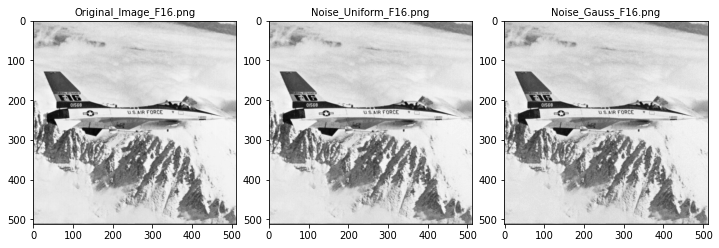

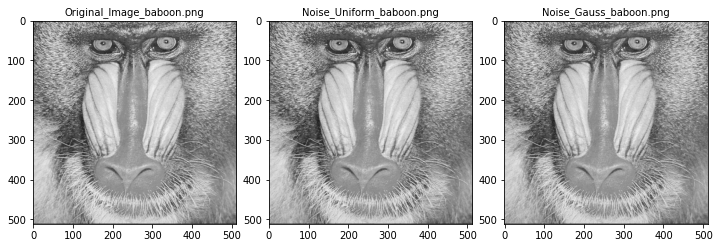

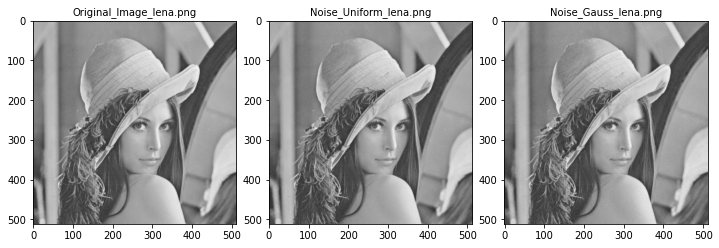

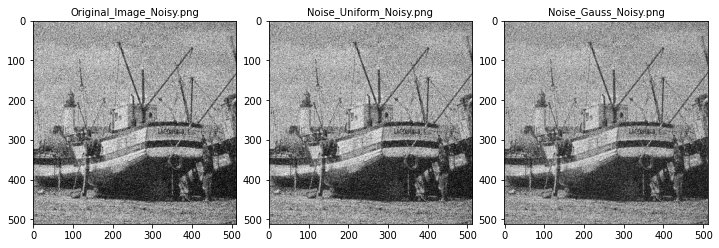

In [ ]:
for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:
                
        # Read image
        img = np.array(Image.open(name).convert('L'), dtype = 'uint8') 

        fig, ax = plt.subplots(1,3,figsize=(10,10))

        plt.subplot(331)
        plt.axis('on')
        plt.title('Original_Image_'+name, size=10)
        plt.imshow(img,cmap='gray')

        plt.subplot(332)
        plt.axis('on')
        plt.title('Noise_Uniform_'+name, size=10)
        plt.imshow(noisy("uniform",img),cmap='gray')

        plt.subplot(333)
        plt.axis('on')
        plt.title('Noise_Gauss_'+name, size=10)
        plt.imshow(noisy("gauss",img),cmap='gray')

        fig.tight_layout()
        plt.show()

###ii. Apply the ideal low-pass filter to obtain the denoised results with different settings.

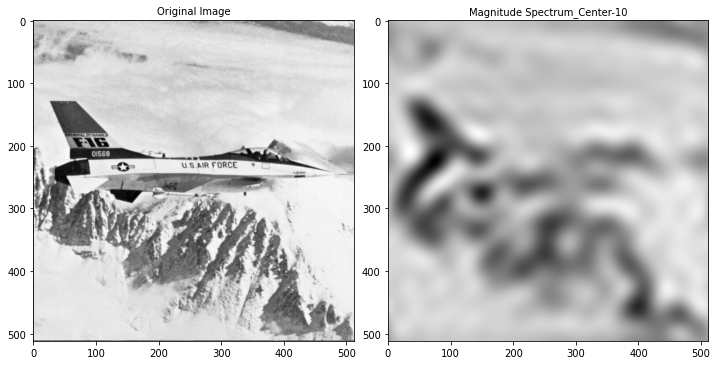

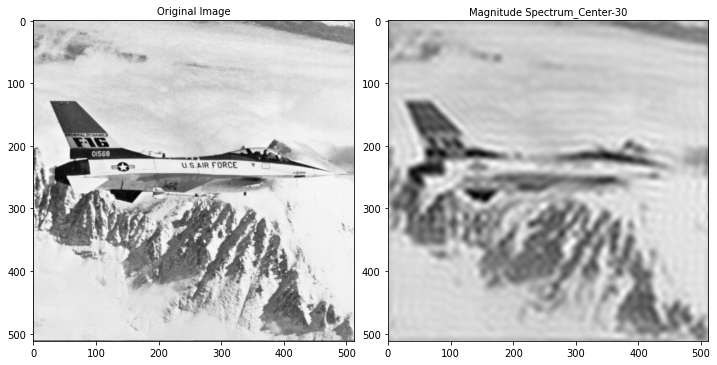

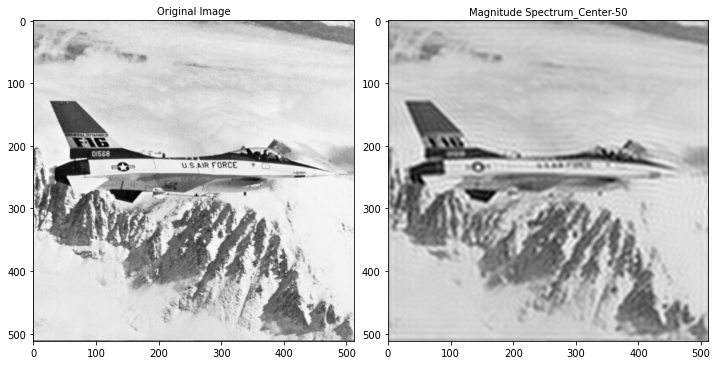

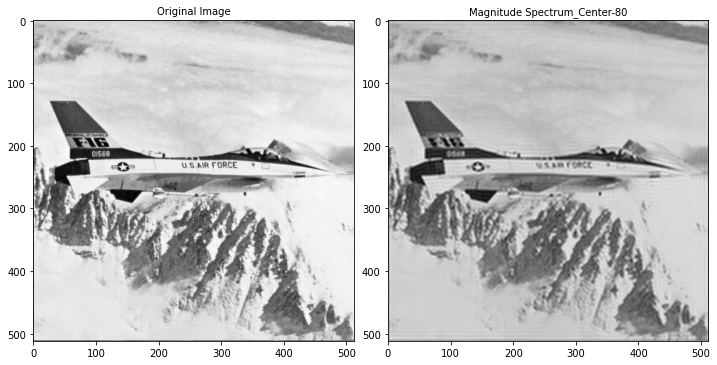

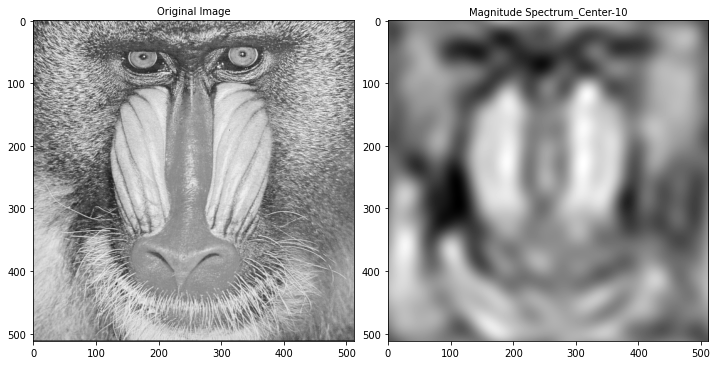

...

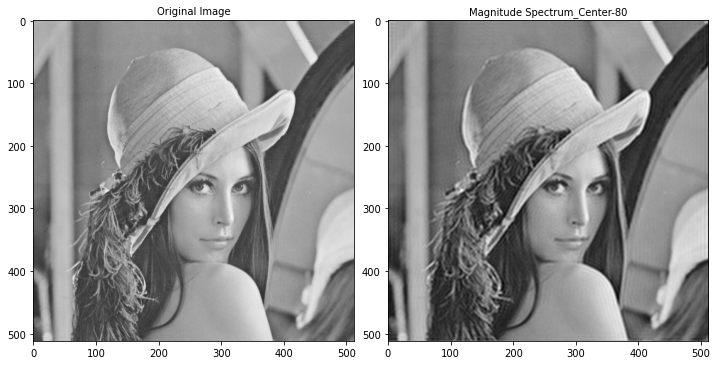

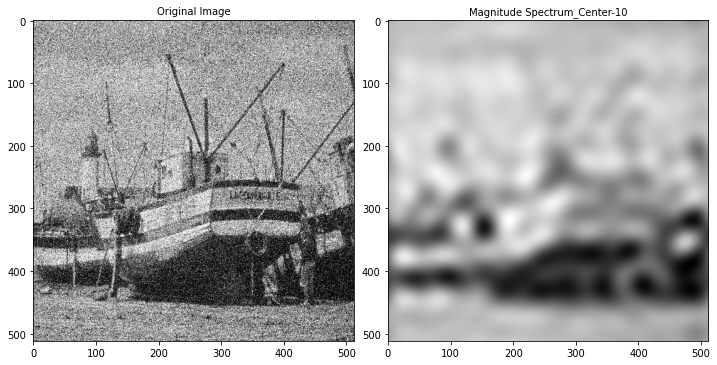

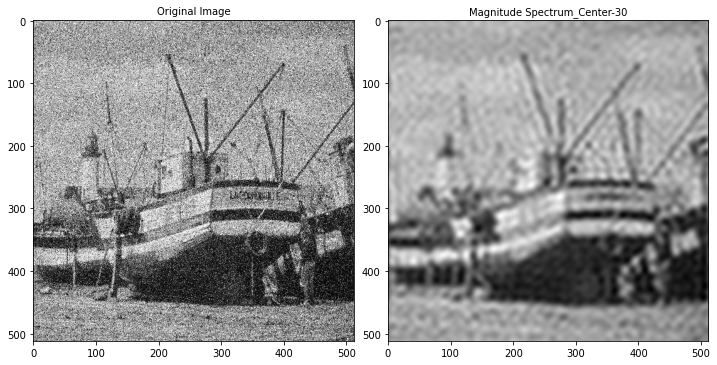

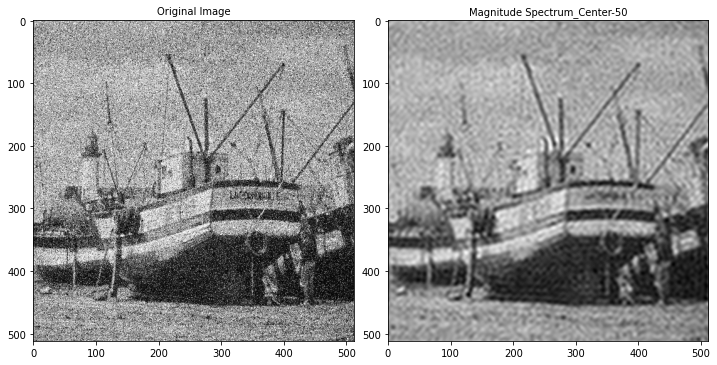

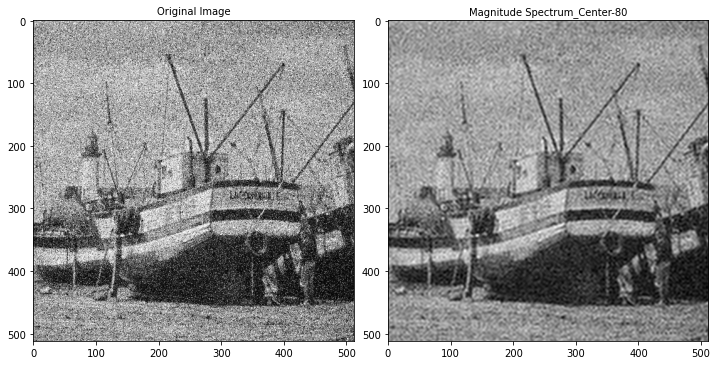

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt


for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:
     for i in [10, 30, 50,80]:

        # Read image
        img = np.array(Image.open(name).convert('L'), dtype = 'uint8') 
        img_float32 = np.float32(img)

        fig,ax = plt.subplots(1,2,figsize=(10,10))   


        dft = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
        dft_shift = np.fft.fftshift(dft)

        rows, cols = img.shape
        crow, ccol = int(rows/2) , int(cols/2)     # center

        # create a mask first, center square is 1, remaining all zeros
        mask = np.zeros((rows, cols, 2), np.uint8)
        mask[crow-i:crow+i, ccol-i:ccol+i] = 1

        # apply mask and inverse DFT
        fshift = dft_shift*mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = cv2.idft(f_ishift)
        img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

        plt.subplot(221),plt.imshow(img, cmap = 'gray')
        plt.axis('on')
        plt.title('Original Image', size=10)

        plt.subplot(222),plt.imshow(img_back, cmap = 'gray')
        plt.axis('on')
        plt.title('Magnitude Spectrum_Center-'+str(i), size=10)
        

        fig.tight_layout()

###iii. Apply the Gaussian low-pass filter to obtain the denoised results with different settings.

####Definition


In [ ]:
import numpy as np
import cv2
from scipy import signal
from scipy import misc
import math
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
def _preprocess_resize_output_shape(image, output_shape):
    """Validate resize output shape according to input image.
    Parameters
    ----------
    image: ndarray
        Image to be resized.
    output_shape: iterable
        Size of the generated output image `(rows, cols[, ...][, dim])`. If
        `dim` is not provided, the number of channels is preserved.
    Returns
    -------
    image: ndarray
        The input image, but with additional singleton dimensions appended in
        the case where ``len(output_shape) > input.ndim``.
    output_shape: tuple
        The output image converted to tuple.
    Raises
    ------
    ValueError:
        If output_shape length is smaller than the image number of
        dimensions
    Notes
    -----
    The input image is reshaped if its number of dimensions is not
    equal to output_shape_length.
    """
    output_shape = tuple(output_shape)
    output_ndim = len(output_shape)
    input_shape = image.shape
    if output_ndim > image.ndim:
        # append dimensions to input_shape
        input_shape += (1, ) * (output_ndim - image.ndim)
        image = np.reshape(image, input_shape)
    elif output_ndim == image.ndim - 1:
        # multichannel case: append shape of last axis
        output_shape = output_shape + (image.shape[-1], )
    elif output_ndim < image.ndim:
        raise ValueError("output_shape length cannot be smaller than the "
                         "image number of dimensions")

    return image, 

In [ ]:
def resize(image, output_shape, order=None, mode='reflect', cval=0, clip=True,
           preserve_range=False, anti_aliasing=None, anti_aliasing_sigma=None, interpolation = cv2.INTER_AREA):
    """Resize image to match a certain size.
    Performs interpolation to up-size or down-size N-dimensional images. Note
    that anti-aliasing should be enabled when down-sizing images to avoid
    aliasing artifacts. For downsampling with an integer factor also see
    `skimage.transform.downscale_local_mean`.
    Parameters
    ----------
    image : ndarray
        Input image.
    output_shape : iterable
        Size of the generated output image `(rows, cols[, ...][, dim])`. If
        `dim` is not provided, the number of channels is preserved. In case the
        number of input channels does not equal the number of output channels a
        n-dimensional interpolation is applied.
    Returns
    -------
    resized : ndarray
        Resized version of the input.
    Other parameters
    ----------------
    order : int, optional
        The order of the spline interpolation, default is 0 if
        image.dtype is bool and 1 otherwise. The order has to be in
        the range 0-5. See `skimage.transform.warp` for detail.
    mode : {'constant', 'edge', 'symmetric', 'reflect', 'wrap'}, optional
        Points outside the boundaries of the input are filled according
        to the given mode.  Modes match the behaviour of `numpy.pad`.
    cval : float, optional
        Used in conjunction with mode 'constant', the value outside
        the image boundaries.
    clip : bool, optional
        Whether to clip the output to the range of values of the input image.
        This is enabled by default, since higher order interpolation may
        produce values outside the given input range.
    preserve_range : bool, optional
        Whether to keep the original range of values. Otherwise, the input
        image is converted according to the conventions of `img_as_float`.
        Also see https://scikit-image.org/docs/dev/user_guide/data_types.html
    anti_aliasing : bool, optional
        Whether to apply a Gaussian filter to smooth the image prior
        to downsampling. It is crucial to filter when downsampling
        the image to avoid aliasing artifacts. If not specified, it is set to
        True when downsampling an image whose data type is not bool.
    anti_aliasing_sigma : {float, tuple of floats}, optional
        Standard deviation for Gaussian filtering used when anti-aliasing.
        By default, this value is chosen as (s - 1) / 2 where s is the
        downsampling factor, where s > 1. For the up-size case, s < 1, no
        anti-aliasing is performed prior to rescaling.
    Notes
    -----
    Modes 'reflect' and 'symmetric' are similar, but differ in whether the edge
    pixels are duplicated during the reflection.  As an example, if an array
    has values [0, 1, 2] and was padded to the right by four values using
    symmetric, the result would be [0, 1, 2, 2, 1, 0, 0], while for reflect it
    would be [0, 1, 2, 1, 0, 1, 2].
    Examples
    --------
    >>> from skimage import data
    >>> from skimage.transform import resize
    >>> image = data.camera()
    >>> resize(image, (100, 100)).shape
    (100, 100)
    """

    image, output_shape = _preprocess_resize_output_shape(image, output_shape)
    input_shape = image.shape
    input_type = image.dtype

    if input_type == np.float16:
        image = image.astype(np.float32)

    if anti_aliasing is None:
        anti_aliasing = (not input_type == bool and
                         any(x < y for x, y in zip(output_shape, input_shape)))

    if input_type == bool and anti_aliasing:
        raise ValueError("anti_aliasing must be False for boolean images")

    factors = np.divide(input_shape, output_shape)
    order = _validate_interpolation_order(input_type, order)
    if order > 0:
        image = convert_to_float(image, preserve_range)

    # Save input value range for clip
    img_bounds = np.array([image.min(), image.max()]) if clip else None

    # Translate modes used by np.pad to those used by scipy.ndimage
    ndi_mode = _to_ndimage_mode(mode)
    if anti_aliasing:
        if anti_aliasing_sigma is None:
            anti_aliasing_sigma = np.maximum(0, (factors - 1) / 2)
        else:
            anti_aliasing_sigma = \
                np.atleast_1d(anti_aliasing_sigma) * np.ones_like(factors)
            if np.any(anti_aliasing_sigma < 0):
                raise ValueError("Anti-aliasing standard deviation must be "
                                 "greater than or equal to zero")
            elif np.any((anti_aliasing_sigma > 0) & (factors <= 1)):
                warn("Anti-aliasing standard deviation greater than zero but "
                     "not down-sampling along all axes")
        image = ndi.gaussian_filter(image, anti_aliasing_sigma,
                                    cval=cval, mode=ndi_mode)

    if NumpyVersion(scipy.__version__) >= '1.6.0':
        # The grid_mode kwarg was introduced in SciPy 1.6.0
        zoom_factors = [1 / f for f in factors]
        out = ndi.zoom(image, zoom_factors, order=order, mode=ndi_mode,
                       cval=cval, grid_mode=True)

    # TODO: Remove the fallback code below once SciPy >= 1.6.0 is required.

    # 2-dimensional interpolation
    elif len(output_shape) == 2 or (len(output_shape) == 3 and
                                    output_shape[2] == input_shape[2]):
        rows = output_shape[0]
        cols = output_shape[1]
        input_rows = input_shape[0]
        input_cols = input_shape[1]
        if rows == 1 and cols == 1:
            tform = AffineTransform(translation=(input_cols / 2.0 - 0.5,
                                                 input_rows / 2.0 - 0.5))
        else:
            # 3 control points necessary to estimate exact AffineTransform
            src_corners = np.array([[1, 1], [1, rows], [cols, rows]]) - 1
            dst_corners = np.zeros(src_corners.shape, dtype=np.double)
            # take into account that 0th pixel is at position (0.5, 0.5)
            dst_corners[:, 0] = factors[1] * (src_corners[:, 0] + 0.5) - 0.5
            dst_corners[:, 1] = factors[0] * (src_corners[:, 1] + 0.5) - 0.5

            tform = AffineTransform()
            tform.estimate(src_corners, dst_corners)

        # Make sure the transform is exactly metric, to ensure fast warping.
        tform.params[2] = (0, 0, 1)
        tform.params[0, 1] = 0
        tform.params[1, 0] = 0

        # clip outside of warp to clip w.r.t input values, not filtered values.
        out = warp(image, tform, output_shape=output_shape, order=order,
                   mode=mode, cval=cval, clip=False,
                   preserve_range=preserve_range)

    else:  # n-dimensional interpolation

        coord_arrays = [factors[i] * (np.arange(d) + 0.5) - 0.5
                        for i, d in enumerate(output_shape)]

        coord_map = np.array(np.meshgrid(*coord_arrays,
                                         sparse=False,
                                         indexing='ij'))

        out = ndi.map_coordinates(image, coord_map, order=order,
                                  mode=ndi_mode, cval=cval)

    _clip_warp_output(img_bounds, out, mode, cval, clip)

    return out

####Gaussian Low-Pass Filter

In [ ]:
def dnorm(x, mu, sd):
    return 1 / (np.sqrt(2 * np.pi) * sd) * np.e ** (-np.power((x - mu) / sd, 2) / 2)


def gaussian_kernel(size, sigma=1, verbose=False):
    kernel_1D = np.linspace(-(size // 2), size // 2, size)
    for i in range(size):
        kernel_1D[i] = dnorm(kernel_1D[i], 0, sigma)
    kernel_2D = np.outer(kernel_1D.T, kernel_1D.T)

    kernel_2D *= 1.0 / kernel_2D.max()

    if verbose:
        plt.imshow(kernel_2D, interpolation='none', cmap='gray')
        plt.title("Kernel ( {}X{} )".format(size, size))
        plt.show()

    return kernel_2D

def convolution(image, kernel, average=False, verbose=False):
    if len(image.shape) == 3:
        print("Found 3 Channels : {}".format(image.shape))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        print("Converted to Gray Channel. Size : {}".format(image.shape))
    else:
        print("Image Shape : {}".format(image.shape))

    print("Kernel Shape : {}".format(kernel.shape))

    if verbose:
        plt.imshow(image, cmap='gray')
        plt.title("Image")
        plt.show()

    image_row, image_col = image.shape
    kernel_row, kernel_col = kernel.shape

    output = np.zeros(image.shape)

    pad_height = int((kernel_row - 1) / 2)
    pad_width = int((kernel_col - 1) / 2)

    padded_image = np.zeros((image_row + (2 * pad_height), image_col + (2 * pad_width)))

    padded_image[pad_height:padded_image.shape[0] - pad_height, pad_width:padded_image.shape[1] - pad_width] = image

    if verbose:
        plt.imshow(padded_image, cmap='gray')
        plt.title("Padded Image")
        plt.show()

    for row in range(image_row):
        for col in range(image_col):
            output[row, col] = np.sum(kernel * padded_image[row:row + kernel_row, col:col + kernel_col])
            if average:
                output[row, col] /= kernel.shape[0] * kernel.shape[1]

    print("Output Image size : {}".format(output.shape))

    if verbose:
        plt.imshow(output, cmap='gray')
        plt.title("Output Image using {}X{} Kernel".format(kernel_row, kernel_col))
        #plt.show()

    return output

def gaussian_blur(image, kernel_size, verbose=False):
    kernel = gaussian_kernel(kernel_size, sigma=math.sqrt(kernel_size), verbose=verbose)
    return convolution(image, kernel, average=True, verbose=verbose)

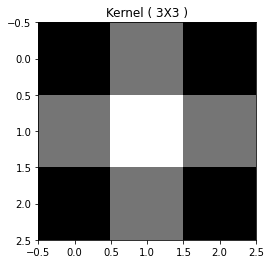

Image Shape : (512, 512)
Kernel Shape : (3, 3)


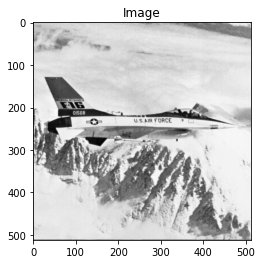

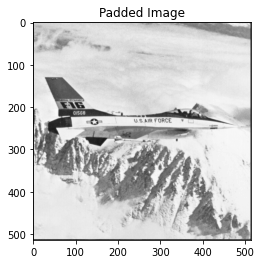

Output Image size : (512, 512)


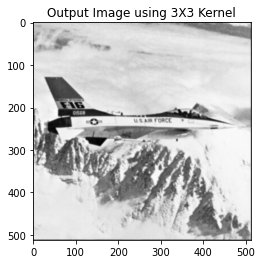

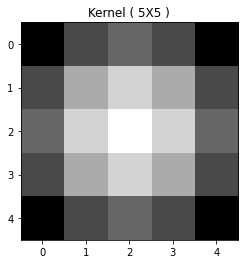

Image Shape : (512, 512)
Kernel Shape : (5, 5)


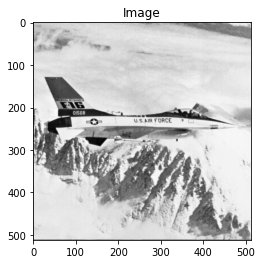

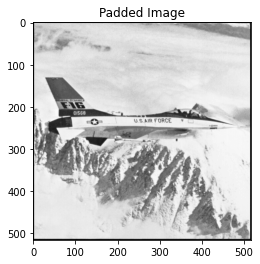

Output Image size : (512, 512)


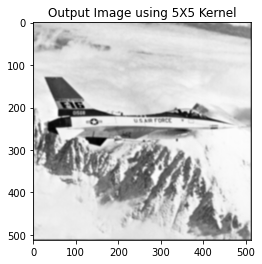

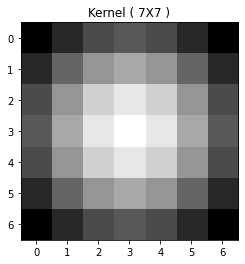

Image Shape : (512, 512)
Kernel Shape : (7, 7)


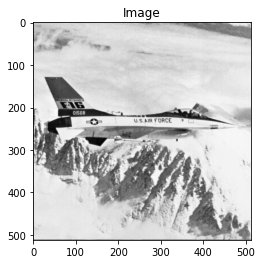

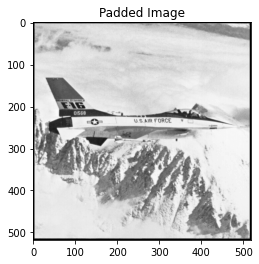

Output Image size : (512, 512)


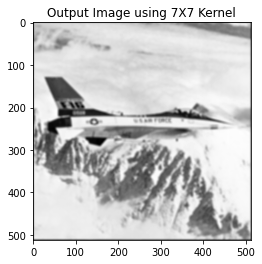

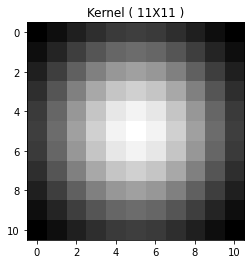

Image Shape : (512, 512)
Kernel Shape : (11, 11)


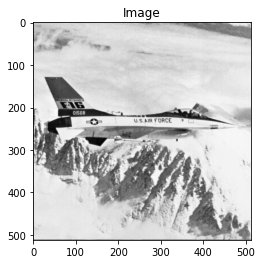

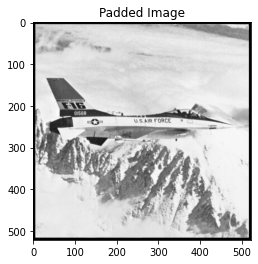

Output Image size : (512, 512)


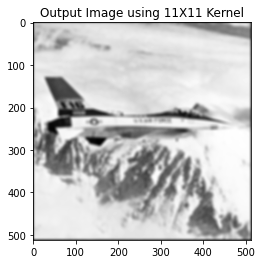

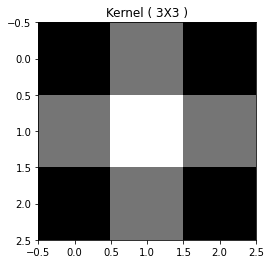

Image Shape : (512, 512)
Kernel Shape : (3, 3)


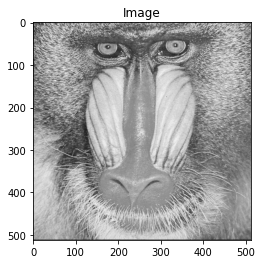

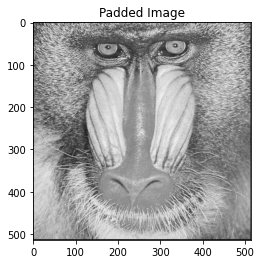

Output Image size : (512, 512)


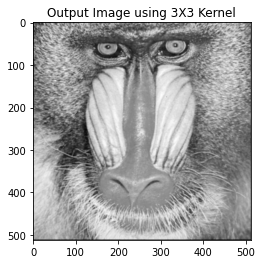

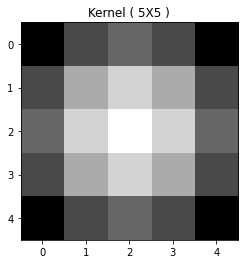

Image Shape : (512, 512)
Kernel Shape : (5, 5)


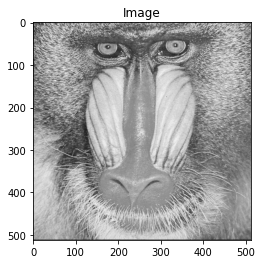

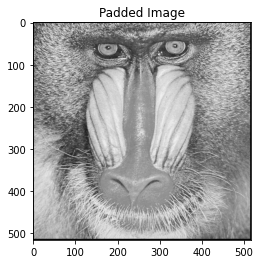

Output Image size : (512, 512)


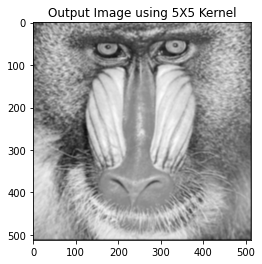

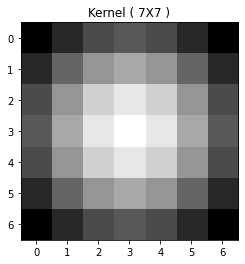

Image Shape : (512, 512)
Kernel Shape : (7, 7)


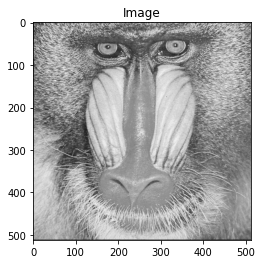

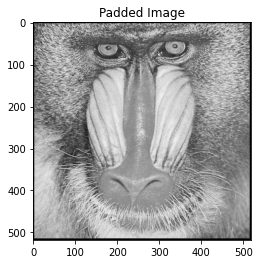

Output Image size : (512, 512)


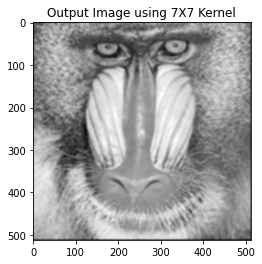

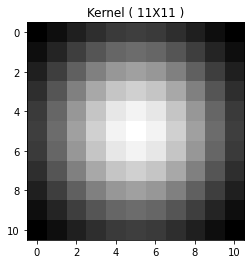

Image Shape : (512, 512)
Kernel Shape : (11, 11)


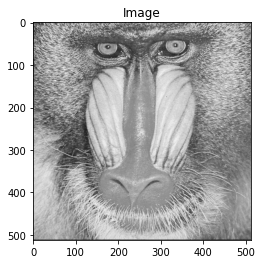

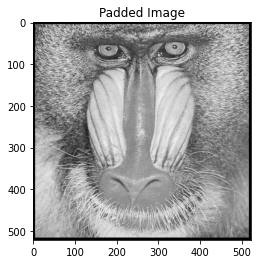

Output Image size : (512, 512)


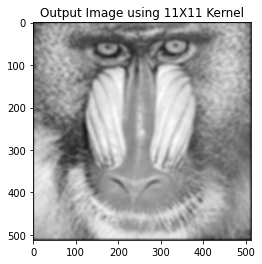

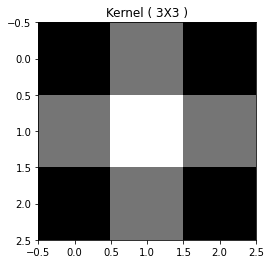

Image Shape : (512, 512)
Kernel Shape : (3, 3)


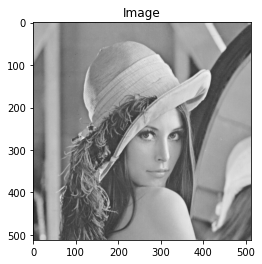

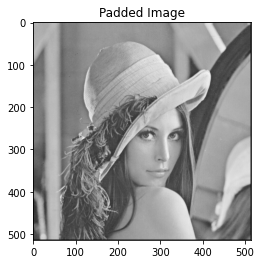

Output Image size : (512, 512)


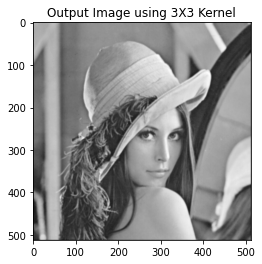

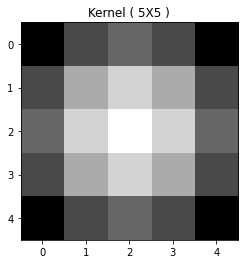

Image Shape : (512, 512)
Kernel Shape : (5, 5)


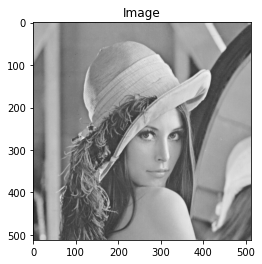

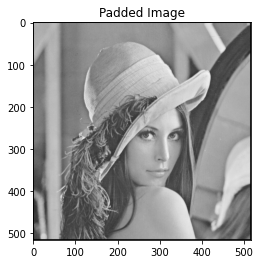

Output Image size : (512, 512)


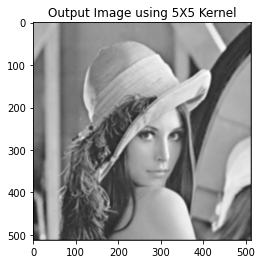

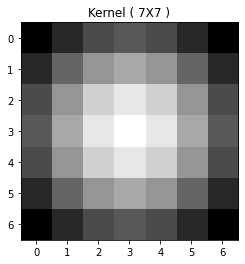

Image Shape : (512, 512)
Kernel Shape : (7, 7)


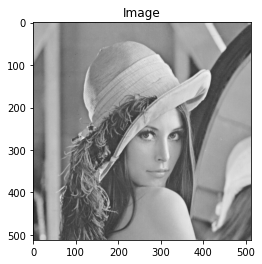

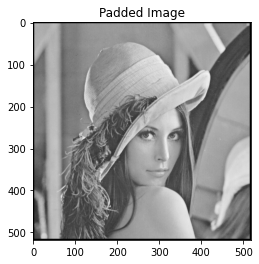

Output Image size : (512, 512)


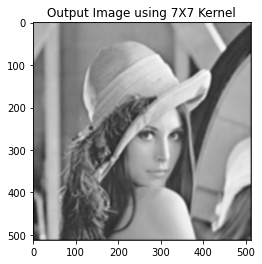

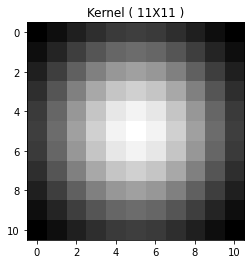

Image Shape : (512, 512)
Kernel Shape : (11, 11)


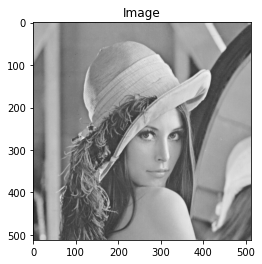

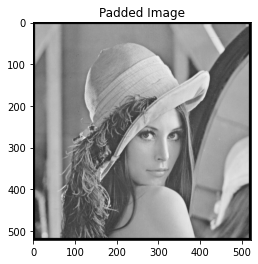

Output Image size : (512, 512)


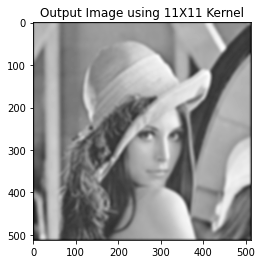

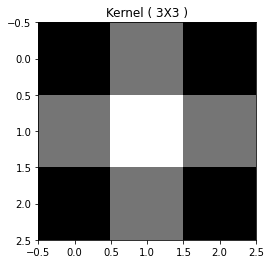

Image Shape : (512, 512)
Kernel Shape : (3, 3)


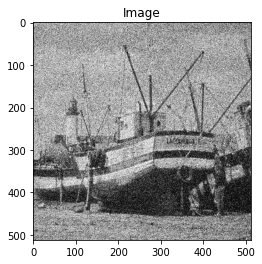

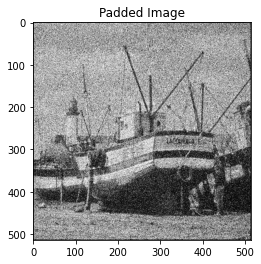

Output Image size : (512, 512)


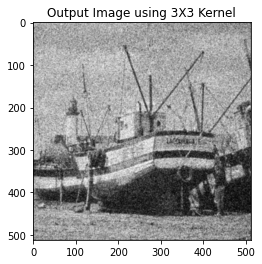

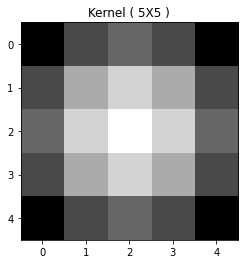

Image Shape : (512, 512)
Kernel Shape : (5, 5)


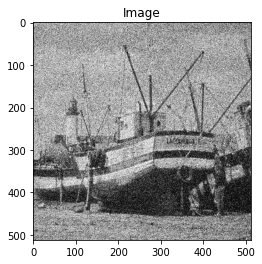

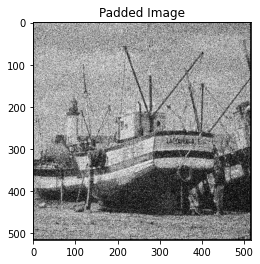

Output Image size : (512, 512)


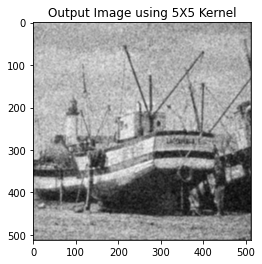

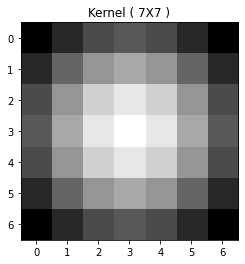

Image Shape : (512, 512)
Kernel Shape : (7, 7)


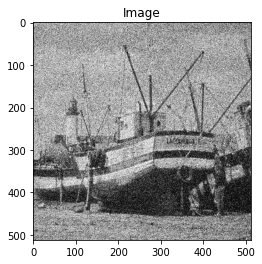

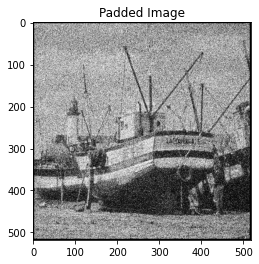

Output Image size : (512, 512)


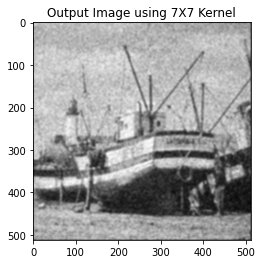

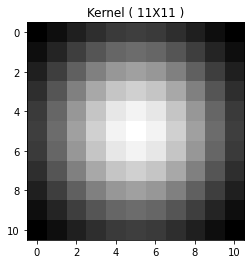

Image Shape : (512, 512)
Kernel Shape : (11, 11)


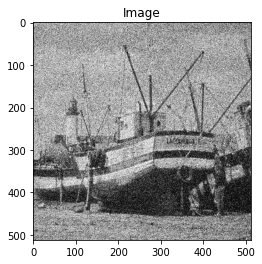

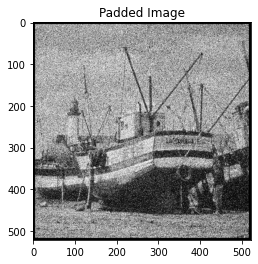

Output Image size : (512, 512)


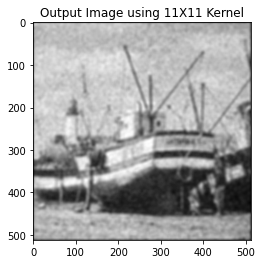

In [ ]:
for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:
                   
        # Read image
        im = np.array(Image.open(name).convert('L'), dtype = 'uint8')

        for i in [3, 5, 7, 11]:


            #Gassian filter blur
            blur= gaussian_blur(im, i, verbose=True)

            pyplot.imshow(blur)
            pyplot.show()   

##3.High-pass filter

#### Definition

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
#%matplotlib inline

#import matplotlib.image as img
#import PIL.Image as Image 
from PIL import Image
import math
import cmath

import time

import csv

from numpy import binary_repr

from fractions import gcd

class DFT(object):
    """
    This class DFT implements all the procedures for transforming a given 2D digital image
    into its corresponding frequency-domain image (Forward DFT Transform)
    """
    
    def __init__():
        pass
    
    @classmethod
    def __computeConjugate(self, mat):
        """
        Computes the conjugate of a complex square-matrix.

        Parameters
        ----------
        mat : ndarray
            Input matrix of complex numbers.

        Returns
        -------
        result : ndarray
            The conjugate of the input matrix.
        """
        
        N = mat.shape[0]
        result = np.zeros([N, N], dtype=np.complex)
        
        for i in range(N):
            for j in range(N):
                result[i, j] = (mat[i, j].real) - (mat[i, j].imag*1j)

        return result
    
    @classmethod
    def __multiplyMatrices(self, mat1, mat2):
        """
        Computes the multiplication of two complex square matrices.

        Parameters
        ----------
        mat1 : ndarray
            First input matrix of complex numbers.
        mat2 : ndarray
            Second input matrix of complex numbers.
            
        Returns
        -------
        result : ndarray
            The multiplication result of the two matrices.
        """
        
        N = mat1.shape[0]
        
        result = np.zeros([N, N], np.complex)
        #For each column and row...
        for i in range(N):
            row = mat1[i, :]
            for j in range(N):
                col = mat2[j, :]
                total = 0 + 0j
                for k in range(N):
                    total += row[k]*col[k]
                result[i, j] = total
        
        return result
        
    #Compute the two separable kernels for the forward DFT.
    @classmethod
    def computeXForwardKernel(self, size):
        """
        Computes/generates the first forward kernel function.

        Parameters
        ----------
        size : int
            Size of the kernel to be generated.

        Returns
        -------
        xKernel : ndarray
            The generated kernel as a matrix.
        """
        
        #Initialize the kernel
        xKernel = np.zeros([size, size], dtype=np.complex)
        
        #Compute each value of the kernel...
        for u in range(size):
            for x in range(size):
                
                #Rounding it is used here for making the values integers as it will insert very small fractions.
                xKernel[u, x] = math.cos((2*math.pi*u*x)/size) - (1j*math.sin((2*math.pi*u*x)/size))
        
        #Return the resulting kernel
        return xKernel

    @classmethod
    def computeYForwardKernel(self, xKernel):
        """
        Computes/generates the second forward kernel function.

        Parameters
        ----------
        xKernel : ndarray
            The first forward kernel function.

        Returns
        -------
        yKernel : ndarray
            The generated kernel as a matrix.
        """
        #yKernel = np.conj(xKernel) ## In numpy package.
        N = xKernel.shape[0]
        
        #For each value, find the conjugate...
        yKernel = np.zeros([N, N], dtype=np.complex)
        for i in range(N):
            for j in range(N):
                yKernel[i, j] = (xKernel[i, j].real) - (xKernel[i, j].imag*1j)
                
        # Return the resulting kernel (Since the original kernel is symmetric, transpose is not needed)
        return yKernel
    
    @classmethod
    def computeCenteredImage(self, imge):
        """
        Centers a given image.

        Parameters
        ----------
        imge : ndarray
            Input array that stores the image to be centered.

        Returns
        -------
        newImge : int
            The new and centered version of the input image.
        """
        
        #Compute the dimensions of the image
        M, N = imge.shape
        #centeringMatrix = np.zeros([M, N], dtype=int)
        newImge = np.zeros([M, N], dtype=int)
        for x in range(M):
            for y in range(N):
                newImge[x, y] = imge[x, y] * ((-1)**(x+y))

        #newImge = imge * centeringMatrix
        return newImge
    
    @classmethod
    def computeForward2DDFTWithSeparability(self, imge):
        """
        Computes/generates the 2D DFT by computing the two forward kernels first (Separability).

        Parameters
        ----------
        imge : ndarray
            The input image to be transformed.

        Returns
        -------
        final2DDFT : ndarray
            The transformed image.
        """
        
        N = imge.shape[0]
        xKernel = DFT.computeXForwardKernel(N)
        yKernel = DFT.computeYForwardKernel(xKernel)

        #row1DDFT = (1.0/size) * np.dot(xKernel, imge)
        intermediate2DDFT = (1.0/N) * DFT.__multiplyMatrices(xKernel, imge)
        final2DDFT = (1.0/N) * DFT.__multiplyMatrices(intermediate2DDFT, yKernel)

        return final2DDFT
        
    @classmethod
    def __computeSinglePoint2DFT(self, imge, u, v, N):
        """
        A private method that computes a single value of the 2DDFT from a given image.

        Parameters
        ----------
        imge : ndarray
            The input image.
        
        u : ndarray
            The index in x-dimension.
            
        v : ndarray
            The index in y-dimension.

        N : int
            Size of the image.
            
        Returns
        -------
        result : complex number
            The computed single value of the DFT.
        """
        result = 0 + 0j
        for x in range(N):
            for y in range(N):
                result += (imge[x, y] * (math.cos((2*math.pi*(u*x + v*y))/N) - 
                                         (1j*math.sin((2*math.pi*(u*x + v*y))/N))))
        return result
    
    @classmethod
    def computeForward2DDFTNoSeparability(self, imge):
        """
        Computes/generates the 2D DFT by computing without separating the kernels.

        Parameters
        ----------
        imge : ndarray
            The input image to be transformed.

        Returns
        -------
        final2DDFT : ndarray
            The transformed image.
        """
 
        # Assuming a square image
        N = imge.shape[0]
        final2DDFT = np.zeros([N, N], dtype=np.complex)
        for u in range(N):
            for v in range(N):
                #Compute the DFT value for each cells/points in the resulting transformed image.
                final2DDFT[u, v] = DFT.__computeSinglePoint2DFT(imge, u, v, N)
        return ((1.0/(N**2))*final2DDFT)
    
    @classmethod
    def computeInverse2DDFTWithSeparability(self, dftImge):
        """
        Computes the inverse 2D DFT by computing the two inverse kernels first (Separability).

        Parameters
        ----------
        dftImge : ndarray
            The dft transformed image as input.

        Returns
        -------
        imge : ndarray
            The resulting image in spatial domain from the inverse DFT.
        """
        
        N = dftImge.shape[0]
        
        #Here the kernels are interchanged from the forward DFT
        yKernel = DFT.computeXForwardKernel(N)
        xKernel = DFT.computeYForwardKernel(yKernel)

        intermediateImge = DFT.__multiplyMatrices(xKernel, dftImge)
        imge = DFT.__multiplyMatrices(intermediateImge, yKernel)
        
        #imge = np.real(imge)

        return imge       

    @classmethod
    def compute2DDFTFourierSpectrum(self, dftImge):
        """
        Computes the fourier spectrum of the transformed image.

        Parameters
        ----------
        dftImge : ndarray
            The input transformed image.

        Returns
        -------
        fourierSpect : ndarray
            The computed fourier spectrum.
        """
        N = dftImge.shape[0]
        
        fourierSpect = np.zeros([N, N], dtype=float)
        #Calculate the magnitude of each point(complex number) in the DFT image
        for i in range(N):
            for j in range(N):
                v = dftImge[i, j]
                fourierSpect[i, j] = math.sqrt((v.real)**2 + (v.imag)**2)
        return fourierSpect
    
    @classmethod
    def normalize2DDFTByLog(self, dftImge):
        """
        Computes the log transformation of the transformed DFT image to make the range
        of the fourier values b/n 0 to 255
        
        Parameters
        ----------
        dftImge : ndarray
            The input transformed image.

        Returns
        -------
        dftNormImge : ndarray
            The normalized version of the transformed image.
        """
        
        #Compute the fourier spectrum of the transformed image:
        dftFourierSpect = DFT.compute2DDFTFourierSpectrum(dftImge)
        
        #Normalize the fourier spectrum values:
        dftNormFourierSpect = (255.0/ math.log10(255)) * np.log10(1 + (255.0/(np.max(dftFourierSpect))*dftFourierSpect))
        
        return dftNormFourierSpect
        

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
#%matplotlib inline

#import matplotlib.image as img
#import PIL.Image as Image 
from PIL import Image
import math
import cmath

import time

import csv

from numpy import binary_repr

from fractions import gcd

class FFT(object):
    """
    This class FFT implements all the procedures for transforming a given 2D digital image
    into its corresponding frequency-domain image (FFT)
    """
    
    def __init__():
        pass
    
    @classmethod
    def __computeSingleW(self, num, denom):
        """Computes one value of W from the given numerator and denominator values. """
        return math.cos((2*math.pi*num)/denom) - (1j*math.sin((2*math.pi*num)/denom))
    
    @classmethod
    def __computeW(self, val, denom, oneD=True):
        """Computes 1D or 2D values of W from the given numerator and denominator values."""
        if oneD:
            result = np.zeros([val, 1], dtype=np.complex)
            for i in range(val):
                result[i] = FFT.__computeSingleW(i, denom)
        else:
            result = np.zeros([val, val], dtype=np.complex)
            for i in range(val):
                for j in range(val):
                    result[i, j] = FFT.__computeSingleW((i+j), denom)
        return result
        
    @classmethod
    def computeFFT(self, imge):
        """Computes the FFT of a given image.
        """

        #Compute size of the given image
        N = imge.shape[0]

        #Compute the FFT for the base case (which uses the normal DFT)
        if N == 2:
            return DFT.computeForward2DDFTNoSeparability(imge)

        #Otherwise compute FFT recursively

        #Divide the original image into even and odd
        imgeEE = np.array([[imge[i,j] for i in range(0, N, 2)] for j in range(0, N, 2)]).T
        imgeEO = np.array([[imge[i,j] for i in range(0, N, 2)] for j in range(1, N, 2)]).T
        imgeOE = np.array([[imge[i,j] for i in range(1, N, 2)] for j in range(0, N, 2)]).T
        imgeOO = np.array([[imge[i,j] for i in range(1, N, 2)] for j in range(1, N, 2)]).T

        #Compute FFT for each of the above divided images
        FeeUV = FFT.computeFFT(imgeEE)
        FeoUV = FFT.computeFFT(imgeEO)
        FoeUV = FFT.computeFFT(imgeOE)
        FooUV = FFT.computeFFT(imgeOO)

        #Compute also Ws
        Wu = FFT.__computeW(N//2, N)
        Wv = Wu.T #Transpose
        Wuv = FFT.__computeW(N//2, N, oneD=False)

        #Compute F(u,v) for u,v = 0,1,2,...,N/2  
        imgeFuv = 0.25*(FeeUV + (FeoUV * Wv) + (FoeUV * Wu) + (FooUV * Wuv))

        #Compute F(u, v+M) where M = N/2
        imgeFuMv = 0.25*(FeeUV + (FeoUV * Wv) - (FoeUV * Wu) - (FooUV * Wuv))

        #Compute F(u+M, v) where M = N/2
        imgeFuvM = 0.25*(FeeUV - (FeoUV * Wv) + (FoeUV * Wu) - (FooUV * Wuv))

        #Compute F(u+M, v+M) where M = N/2
        imgeFuMvM = 0.25*(FeeUV - (FeoUV * Wv) - (FoeUV * Wu) + (FooUV * Wuv))

        imgeF1 = np.hstack((imgeFuv, imgeFuvM))
        imgeF2 = np.hstack((imgeFuMv, imgeFuMvM))
        imgeFFT = np.vstack((imgeF1, imgeF2))

        return imgeFFT 
    
    @classmethod
    def computeInverseFFT(self, imgeFFT):
        #return np.real(np.conjugate(FFT.computeFFT(np.conjugate(imgeFFT)*(N**2)))*(N**2))
                #Compute size of the given image
        N = imgeFFT.shape[0]
        return np.real(np.conjugate(FFT.computeFFT(np.conjugate(imgeFFT)*(N**2)))).astype(int)

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
#%matplotlib inline

#import matplotlib.image as img
#import PIL.Image as Image 
from PIL import Image
import math
import cmath

import time

import csv

from numpy import binary_repr

from fractions import gcd

In [ ]:
def constructDuv(N):
    """Constructs the frequency matrix, D(u,v), of size NxN"""
    u = np.arange(N)
    v = np.arange(N)

    idx = np.where(u>N/2)[0]
    u[idx] = u[idx] - N
    idy = np.where(v>N/2)[0]
    v[idy] = v[idx] - N

    [V,U]= np.meshgrid(v,u)
    D = np.sqrt(U**2 + V**2)
    
    return D

In [ ]:
def computeIdealFiltering(D, Do, mode=0):
    """Computes Ideal Filtering based on the cut off frequency (Do).
    If mode=0, it compute Lowpass Filtering otherwise Highpass filtering    
    """
    
    H = np.zeros_like(D)
    if mode==0:
        H = (D<=Do).astype(int)
    else:
        H = (D>Do).astype(int)
    return H

In [ ]:
def computeIdealFilters(imge, F, D, Dos):
    """Computes Ideal Filtering for different cut off frequencies.
       It also calculates their running time.
    """

    #Lowpass filtered images
    gsLP = []
    
    #Highpass filtered images
    gsHP = []
    
    #Running Time
    IRunningTime = []
    
    for Do in Dos:
        
        startTime = time.time()
        #Compute Ideal Lowpass Filter (ILPF)
        H = computeIdealFiltering(D, Do, 0)
        
        IRunningTime.append((time.time() - startTime))

        #Compute the filtered image (result in space domain)
        gsLP.append(computeFilteredImage(H, F))

        #Compute Ideal Highpass Filter (IHPF)
        H = computeIdealFiltering(D, Do, 1)

        #Compute the filtered image (result in space domain)
        gsHP.append(computeFilteredImage(H, F))

    return gsLP, gsHP, IRunningTime

In [ ]:
def computeButterworthFiltering(D, Do, n, mode=0):
    """Computes Ideal Filtering based on the cut off frequency (Do) and n.
    If mode=0, it compute Lowpass Filtering otherwise Highpass filtering    
    """
    
    H = np.zeros_like(D)
    D = D.astype(float)
    
    if mode==0:
        H = 1.0/(1.0 + ((D/Do)**(2*n)))
    else:
        H = 1.0/(1.0 + ((Do/D)**(2*n)))
    return H


     

def computeButterFilters(imge, F, D, Dos, ns):
    """Computes Butterworth Filtering for different cut off frequencies."""

    #Lowpass filtered images
    gsLP = []
    
    #Highpass filtered images
    gsHP = []
    
    #Running Time
    BRunningTime = []
    
    for i, Do in enumerate(Dos):
        
        startTime = time.time()
        #Compute Ideal Lowpass Filter (ILPF)
        H = computeButterworthFiltering(D, Do, ns[i], 0)
        
        BRunningTime.append((time.time() - startTime))

        #Compute the filtered image (result in space domain)
        gsLP.append(computeFilteredImage(H, F))

        #Compute Ideal Highpass Filter (IHPF)
        H = computeButterworthFiltering(D, Do, ns[i], 1)

        #Compute the filtered image (result in space domain)
        gsHP.append(computeFilteredImage(H, F))

    return gsLP, gsHP, BRunningTime


     

def computeFilteredImage(H, F):
    """Computes a filtered image based on the given fourier transormed image(F) and filter(H)."""
    G = H * F #Element-wise multiplication
    g = np.real(FFT.computeInverseFFT(G)).astype(int)
    
    return g


     

def visualizeFilteringResults(imge, F, gsLP, gsHP, Dos, filterType="Ideal", ns=None):
    """Visualizes the filtered images using different cut-off frequencies."""

    fig, axarr = plt.subplots(2, 5, figsize=[10,5])

    axarr[0, 0].imshow(imge, cmap=plt.get_cmap('gray'), )
    axarr[0, 0].set_title("Original Image")
    axarr[0, 0].axes.get_xaxis().set_visible(False)
    axarr[0, 0].axes.get_yaxis().set_visible(False)

    axarr[1, 0].imshow(imge, cmap=plt.get_cmap('gray'))
    axarr[1, 0].set_title("Original Image")
    axarr[1, 0].axes.get_xaxis().set_visible(False)
    axarr[1, 0].axes.get_yaxis().set_visible(False)

    ##Display the filtering Results
    for i, g in enumerate(gsLP):

        if filterType=='Ideal':
            lp = "ILPF(Do="+str(Dos[i])+")"
            hp = "IHPF(Do="+str(Dos[i])+")"
        else:
            lp = "BLPF(Do="+str(Dos[i])+",n="+str(ns[i])+")"
            hp = "BHPF(Do="+str(Dos[i])+",n="+str(ns[i])+")"

        #For lowpass
        axarr[0, i+1].imshow(gsLP[i], cmap=plt.get_cmap('gray'))
        axarr[0, i+1].set_title(lp)
        axarr[0, i+1].axes.get_xaxis().set_visible(False)
        axarr[0, i+1].axes.get_yaxis().set_visible(False)    

        #For highpass
        axarr[1, i+1].imshow(gsHP[i], cmap=plt.get_cmap('gray'))
        axarr[1, i+1].set_title(hp)
        axarr[1, i+1].axes.get_xaxis().set_visible(False)
        axarr[1, i+1].axes.get_yaxis().set_visible(False)    

    plt.show()

####Ideal Filtering

In [ ]:
def DFT(x):
    """
    Function to calculate the 
    discrete Fourier Transform 
    of a 1D real-valued signal x
    """

    N = len(x)
    n = np.arange(N)
    k = n.reshape((N, 1))
    e = np.exp(-2j * np.pi * k * n / N)
    
    X = np.dot(e, x)
    
    return X

<ipython-input-87-a13a41cefd2c>:246: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  final2DDFT = np.zeros([N, N], dtype=np.complex)
<ipython-input-102-8f9e23c9840b>:38: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  result = np.zeros([val, 1], dtype=np.complex)
<ipython-input-102-8f9e23c9840b>:42: DeprecationWarning: `np.c

Ideal Filtering_F16.png


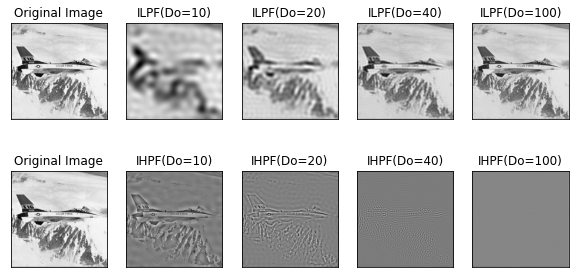

Ideal Filtering_baboon.png


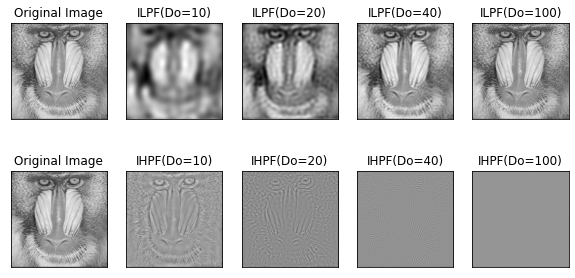

Ideal Filtering_lena.png


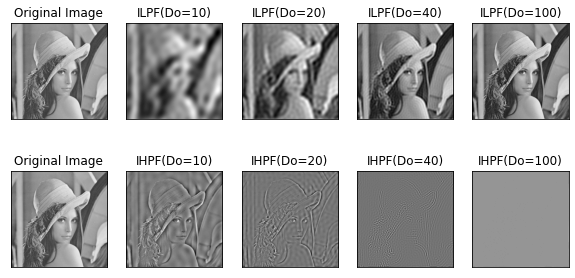

Ideal Filtering_Noisy.png


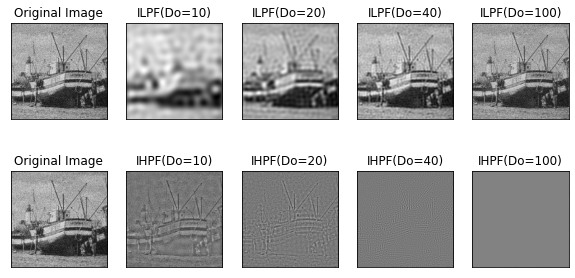

In [ ]:
for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:

        # Read image
        img = np.array(Image.open(name).convert('L'), dtype = 'uint8') 

        N = img.shape[0]

        #Construct the DFT of the image
        F = FFT.computeFFT(img)

        #Construct the D(u,v) matrix
        D = constructDuv(N)

        Dos = np.array([10, 20, 40, 100]) #Cut off frequencies

        #Ideal Filtering
        gsILP, gsIHP, IRunningTime = computeIdealFilters(img, F, D, Dos)

        print('Ideal Filtering_'+name)
        visualizeFilteringResults(img, F, gsILP, gsIHP, Dos, 'Ideal')
        
        fig.tight_layout()

####Butterworth Filtering

In [ ]:
for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:

        # Read image
        img = np.array(Image.open(name).convert('L'), dtype = 'uint8') 

        N = img.shape[0]

        #Construct the DFT of the image
        F = FFT.computeFFT(img)

        #Construct the D(u,v) matrix
        D = constructDuv(N)

        Dos = np.array([10, 20, 40, 100]) #Cut off frequencies

        #Ideal Filtering
        gsILP, gsIHP, IRunningTime = computeIdealFilters(img, F, D, Dos)

        print('Ideal Filtering_'+name)
        visualizeFilteringResults(img, F, gsILP, gsIHP, Dos, 'Ideal')
        
        fig.tight_layout()

<ipython-input-87-a13a41cefd2c>:246: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  final2DDFT = np.zeros([N, N], dtype=np.complex)
<ipython-input-102-8f9e23c9840b>:38: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  result = np.zeros([val, 1], dtype=np.complex)
<ipython-input-102-8f9e23c9840b>:42: DeprecationWarning: `np.c

Butterworth Filtering_F16.png


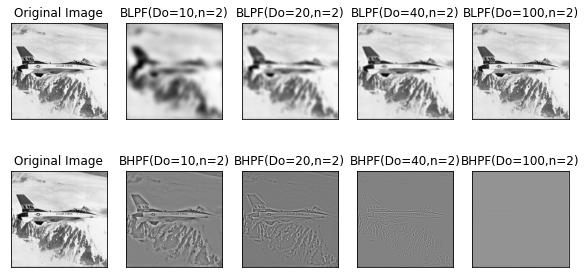

Butterworth Filtering_baboon.png


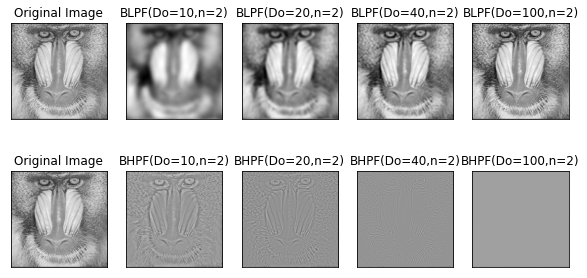

Butterworth Filtering_lena.png


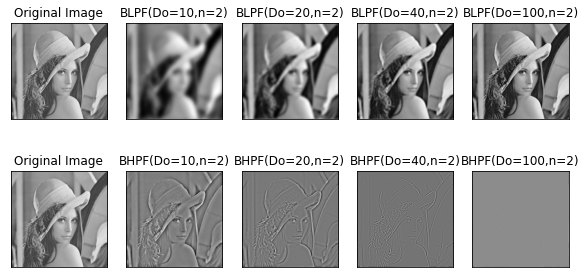

Butterworth Filtering_Noisy.png


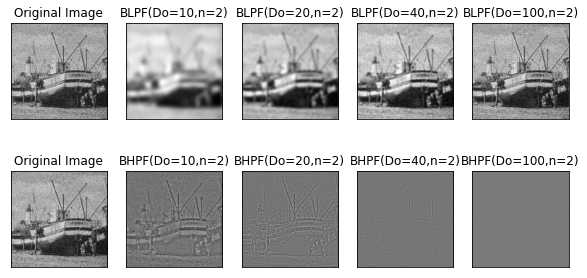

In [ ]:
for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:

        # Read image
        img = np.array(Image.open(name).convert('L'), dtype = 'uint8') 

        N = img.shape[0]

        #Construct the DFT of the image
        F = FFT.computeFFT(img)

        #Construct the D(u,v) matrix
        D = constructDuv(N)

        Dos = np.array([10, 20, 40, 100]) #Cut off frequencies

        #Butterworth Filtering
        ns = np.ones(Dos.shape[0])*2
        gsBLP, gsBHP, BRunningTime = computeButterFilters(img, F, D, Dos, ns)

        print('Butterworth Filtering_'+name)
        visualizeFilteringResults(img, F, gsBLP, gsBHP, Dos, 'Butterworth', ns.astype(int))
        
        fig.tight_layout()

####Laplacian Filter

In [ ]:
import cv2
import math
import numpy as np
import matplotlib.pyplot as plot
import matplotlib.cm as cm
import sys
import pylab
from matplotlib.widgets import Slider

In [ ]:
# Copyright (C) 2003-2005 Peter J. Verveer
#
# Redistribution and use in source and binary forms, with or without
# modification, are permitted provided that the following conditions
# are met:
#
# 1. Redistributions of source code must retain the above copyright
#    notice, this list of conditions and the following disclaimer.
#
# 2. Redistributions in binary form must reproduce the above
#    copyright notice, this list of conditions and the following
#    disclaimer in the documentation and/or other materials provided
#    with the distribution.
#
# 3. The name of the author may not be used to endorse or promote
#    products derived from this software without specific prior
#    written permission.
#
# THIS SOFTWARE IS PROVIDED BY THE AUTHOR ``AS IS'' AND ANY EXPRESS
# OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE IMPLIED
# WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE
# ARE DISCLAIMED. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR ANY
# DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL
# DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE
# GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS
# INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF LIABILITY,
# WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING
# NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE OF THIS
# SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

from collections.abc import Iterable
import warnings
import numpy


def _extend_mode_to_code(mode):
    """Convert an extension mode to the corresponding integer code.
    """
    if mode == 'nearest':
        return 0
    elif mode == 'wrap':
        return 1
    elif mode in ['reflect', 'grid-mirror']:
        return 2
    elif mode == 'mirror':
        return 3
    elif mode == 'constant':
        return 4
    elif mode == 'grid-wrap':
        return 5
    elif mode == 'grid-constant':
        return 6
    else:
        raise RuntimeError('boundary mode not supported')


def _normalize_sequence(input, rank):
    """If input is a scalar, create a sequence of length equal to the
    rank by duplicating the input. If input is a sequence,
    check if its length is equal to the length of array.
    """
    is_str = isinstance(input, str)
    if not is_str and isinstance(input, Iterable):
        normalized = list(input)
        if len(normalized) != rank:
            err = "sequence argument must have length equal to input rank"
            raise RuntimeError(err)
    else:
        normalized = [input] * rank
    return normalized


def _get_output(output, input, shape=None, complex_output=False):
    if shape is None:
        shape = input.shape
    if output is None:
        if not complex_output:
            output = numpy.zeros(shape, dtype=input.dtype.name)
        else:
            complex_type = numpy.promote_types(input.dtype, numpy.complex64)
            output = numpy.zeros(shape, dtype=complex_type)
    elif isinstance(output, (type, numpy.dtype)):
        # Classes (like `np.float32`) and dtypes are interpreted as dtype
        if complex_output and numpy.dtype(output).kind != 'c':
            warnings.warn("promoting specified output dtype to complex")
            output = numpy.promote_types(output, numpy.complex64)
        output = numpy.zeros(shape, dtype=output)
    elif isinstance(output, str):
        output = numpy.sctypeDict[output]
        if complex_output and numpy.dtype(output).kind != 'c':
            raise RuntimeError("output must have complex dtype")
        output = numpy.zeros(shape, dtype=output)
    elif output.shape != shape:
        raise RuntimeError("output shape not correct")
    elif complex_output and output.dtype.kind != 'c':
        raise RuntimeError("output must have complex dtype")
    return output

In [ ]:
__all__ = ['correlate1d', 'convolve1d', 'gaussian_filter1d', 'gaussian_filter',
           'prewitt', 'sobel', 'generic_laplace', 'laplace',
           'gaussian_laplace', 'generic_gradient_magnitude',
           'gaussian_gradient_magnitude', 'correlate', 'convolve',
           'uniform_filter1d', 'uniform_filter', 'minimum_filter1d',
           'maximum_filter1d', 'minimum_filter', 'maximum_filter',
           'rank_filter', 'median_filter', 'percentile_filter',
           'generic_filter1d', 'generic_filter']


def _invalid_origin(origin, lenw):
    return (origin < -(lenw // 2)) or (origin > (lenw - 1) // 2)


def _complex_via_real_components(func, input, weights, output, cval, **kwargs):
    """Complex convolution via a linear combination of real convolutions."""
    complex_input = input.dtype.kind == 'c'
    complex_weights = weights.dtype.kind == 'c'
    if complex_input and complex_weights:
        # real component of the output
        func(input.real, weights.real, output=output.real,
             cval=numpy.real(cval), **kwargs)
        output.real -= func(input.imag, weights.imag, output=None,
                            cval=numpy.imag(cval), **kwargs)
        # imaginary component of the output
        func(input.real, weights.imag, output=output.imag,
             cval=numpy.real(cval), **kwargs)
        output.imag += func(input.imag, weights.real, output=None,
                            cval=numpy.imag(cval), **kwargs)
    elif complex_input:
        func(input.real, weights, output=output.real, cval=numpy.real(cval),
             **kwargs)
        func(input.imag, weights, output=output.imag, cval=numpy.imag(cval),
             **kwargs)
    else:
        if numpy.iscomplexobj(cval):
            raise ValueError("Cannot provide a complex-valued cval when the "
                             "input is real.")
        func(input, weights.real, output=output.real, cval=cval, **kwargs)
        func(input, weights.imag, output=output.imag, cval=cval, **kwargs)
    return output

In [ ]:
from numpy.core.multiarray import normalize_axis_index
def correlate1d(input, weights, axis=-1, output=None, mode="reflect",
                cval=0.0, origin=0):
    """Calculate a 1-D correlation along the given axis.
    The lines of the array along the given axis are correlated with the
    given weights.
    Parameters
    ----------
    %(input)s
    weights : array
        1-D sequence of numbers.
    %(axis)s
    %(output)s
    %(mode_reflect)s
    %(cval)s
    %(origin)s
    Examples
    --------
    >>> from scipy.ndimage import correlate1d
    >>> correlate1d([2, 8, 0, 4, 1, 9, 9, 0], weights=[1, 3])
    array([ 8, 26,  8, 12,  7, 28, 36,  9])
    """
    input = numpy.asarray(input)
    weights = numpy.asarray(weights)
    complex_input = input.dtype.kind == 'c'
    complex_weights = weights.dtype.kind == 'c'
    if complex_input or complex_weights:
        if complex_weights:
            weights = weights.conj()
            weights = weights.astype(numpy.complex128, copy=False)
        kwargs = dict(axis=axis, mode=mode, origin=origin)
        output =_get_output(output, input, complex_output=True)
        return _complex_via_real_components(correlate1d, input, weights,
                                            output, cval, **kwargs)

    output = _get_output(output, input)
    weights = numpy.asarray(weights, dtype=numpy.float64)
    if weights.ndim != 1 or weights.shape[0] < 1:
        raise RuntimeError('no filter weights given')
    if not weights.flags.contiguous:
        weights = weights.copy()
    axis = normalize_axis_index(axis, input.ndim)
    if _invalid_origin(origin, len(weights)):
        raise ValueError('Invalid origin; origin must satisfy '
                         '-(len(weights) // 2) <= origin <= '
                         '(len(weights)-1) // 2')
    mode = _extend_mode_to_code(mode)
    correlate1d(input, weights, axis, output, mode, cval,
                          origin)
    return output

In [ ]:
def generic_laplace(input, derivative2, output=None, mode="reflect",
                    cval=0.0,
                    extra_arguments=(),
                    extra_keywords=None):
    """
    N-D Laplace filter using a provided second derivative function.
    Parameters
    ----------
    %(input)s
    derivative2 : callable
        Callable with the following signature::
            derivative2(input, axis, output, mode, cval,
                        *extra_arguments, **extra_keywords)
        See `extra_arguments`, `extra_keywords` below.
    %(output)s
    %(mode_multiple)s
    %(cval)s
    %(extra_keywords)s
    %(extra_arguments)s
    """
    if extra_keywords is None:
        extra_keywords = {}
    input = numpy.asarray(input)
    output = _get_output(output, input)
    axes = list(range(input.ndim))
    if len(axes) > 0:
        modes = _normalize_sequence(mode, len(axes))
        derivative2(input, axes[0], output, modes[0], cval,
                    *extra_arguments, **extra_keywords)
        for ii in range(1, len(axes)):
            tmp = derivative2(input, axes[ii], output.dtype, modes[ii], cval,
                              *extra_arguments, **extra_keywords)
            output += tmp
    else:
        output[...] = input[...]
    return output


In [ ]:
def laplace(input, output=None, mode="reflect", cval=0.0):
    """N-D Laplace filter based on approximate second derivatives.
    Parameters
    ----------
    %(input)s
    %(output)s
    %(mode_multiple)s
    %(cval)s
    Examples
    --------
    >>> from scipy import ndimage, misc
    >>> import matplotlib.pyplot as plt
    >>> fig = plt.figure()
    >>> plt.gray()  # show the filtered result in grayscale
    >>> ax1 = fig.add_subplot(121)  # left side
    >>> ax2 = fig.add_subplot(122)  # right side
    >>> ascent = misc.ascent()
    >>> result = ndimage.laplace(ascent)
    >>> ax1.imshow(ascent)
    >>> ax2.imshow(result)
    >>> plt.show()
    """
    def derivative2(input, axis, output, mode, cval):
        return correlate1d(input, [1, -2, 1], axis, output, mode, cval, 0)
    return generic_laplace(input, derivative2, output, mode, cval)

---------------File:F16.png-------------


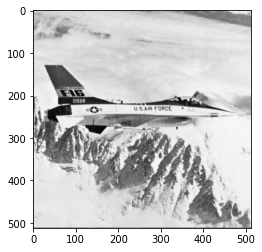

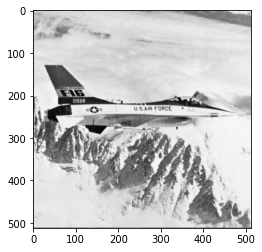

-------------Laplacian Filter--Kernel Size:3-------------


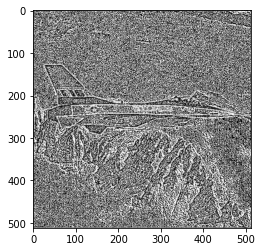

-------------Laplacian Filter--Kernel Size:5-------------


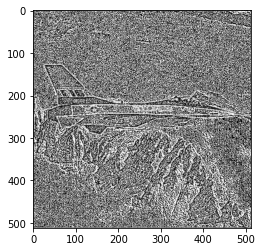

-------------Laplacian Filter--Kernel Size:7-------------


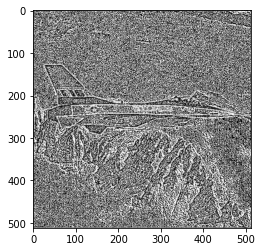

---------------File:baboon.png-------------


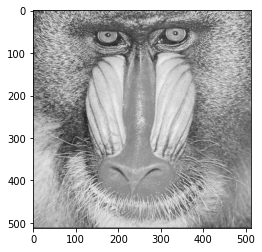

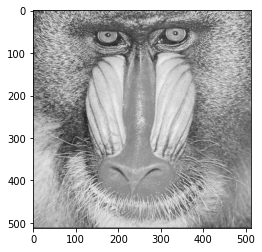

-------------Laplacian Filter--Kernel Size:3-------------


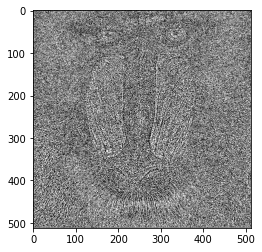

-------------Laplacian Filter--Kernel Size:5-------------


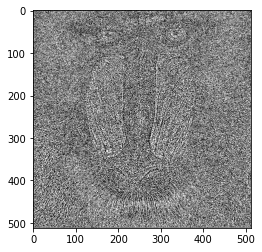

-------------Laplacian Filter--Kernel Size:7-------------


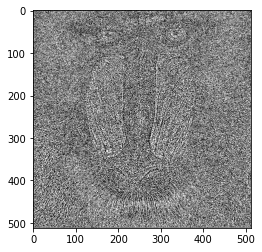

---------------File:lena.png-------------


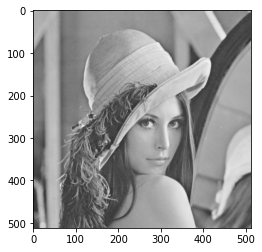

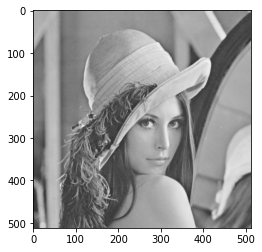

-------------Laplacian Filter--Kernel Size:3-------------


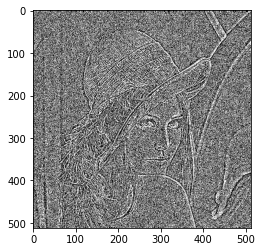

-------------Laplacian Filter--Kernel Size:5-------------


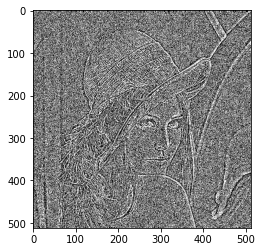

-------------Laplacian Filter--Kernel Size:7-------------


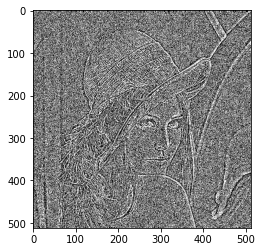

In [ ]:
from scipy import ndimage, misc
for name in ['F16.png', 'baboon.png', 'lena.png']:
   
        matplotlib.rcParams['font.size'] = 10
                
        # Read image
        im = np.array(Image.open(name).convert('L'), dtype = 'uint8')

        print('---------------File:'+str(name)+'-------------')   
        pyplot.imshow(im)
        pyplot.show() 
        pyplot.imshow(im, cmap=plt.cm.gray)
        pyplot.show() 
        
        for i in [3, 5, 7]:

            #Laplacian filter blur
            fig = plt.figure()
            result = ndimage.laplace(im)

            #cv2.imwrite('avg_blurred_'+str(name)+'.png', lp)
            print('-------------'+'Laplacian Filter'+'--Kernel Size:'+str(i)+'-------------')

            pyplot.imshow(result, cmap=plt.cm.gray)
            pyplot.show()

##4.Image denoising

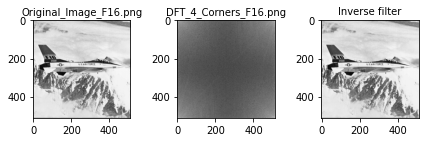

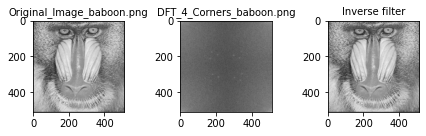

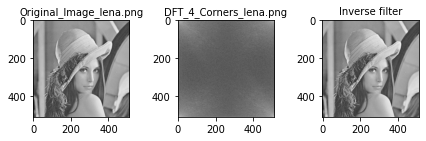

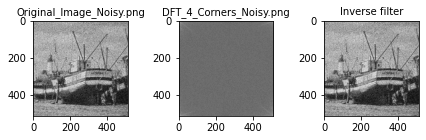

In [ ]:
for name in ['F16.png', 'baboon.png', 'lena.png','Noisy.png']:
                
        # Read image
        img = np.array(Image.open(name).convert('L'), dtype = 'uint8') 

        fig, ax = plt.subplots(1,3,figsize=(6,6))

        plt.subplot(331)
        plt.axis('on')
        plt.title('Original_Image_'+name,size=10)
        plt.imshow(img,cmap='gray')

        dft = cv2.dft(np.float32(img),flags=cv2.DFT_COMPLEX_OUTPUT)
        plt.subplot(332)
        plt.axis('on')
        plt.title('DFT_4_Corners_'+name,size=10)
        plt.imshow(20*np.log(cv2.magnitude(dft[:,:,0],dft[:,:,1])),cmap='gray')
        
        

        idft_shift = np.fft.ifftshift(dft_shift)
        plt.subplot(333)
        plt.axis('on')
        plt.title('Inverse filter',size=10)
        plt.imshow(img,cmap='gray')

        fig.tight_layout()
        plt.show()

##5.DCT as the image restoration domain

In [ ]:
import numpy as np
import cv2

# Load noise.raw image
image = cv2.imread("Noisy.png", cv2.IMREAD_GRAYSCALE)

# Perform full-size DCT transform
image_dct = cv2.dct(image.astype(np.float32))

# Design low-pass filter
filter_dct = np.ones(image_dct.shape, np.float32)
filter_dct[10:, :] = 0
filter_dct[:, 10:] = 0

# Apply filter in DCT domain
image_dct_filtered = image_dct * filter_dct

# Perform inverse DCT transform
image_denoised = cv2.idct(image_dct_filtered)

image_denoised

array([[154.37381, 154.38179, 154.39775, ..., 146.70706, 146.69484,
        146.68869],
       [154.38751, 154.3955 , 154.41144, ..., 146.70659, 146.69437,
        146.68823],
       [154.41492, 154.42285, 154.43875, ..., 146.70563, 146.6934 ,
        146.68729],
       ...,
       [158.57562, 158.58035, 158.58975, ..., 142.20636, 142.15813,
        142.13397],
       [158.61505, 158.6198 , 158.62927, ..., 142.34175, 142.29349,
        142.26932],
       [158.6348 , 158.63954, 158.64903, ..., 142.40952, 142.36122,
        142.337  ]], dtype=float32)

##6.Sparse coding

In [ ]:
import numpy as np
from sklearn.linear_model import Lasso

# Generate dictionary D and test sample X
D = np.random.normal(0, 0.5, size=(256, 1024))
X = np.random.normal(0, 0.5, size=(1024, 1))

In [ ]:
# Find sparsest coefficients using Lasso
lasso = Lasso(alpha=1.0, fit_intercept=False)
lasso.fit(D.T, X)
alpha = lasso.coef_

# Reconstruction using sparse coefficients
recon_sparse = D.T.dot(alpha)

In [ ]:
# Find least squared solution
A = np.linalg.lstsq(D.T, X, rcond=None)
alpha_ls = A[0]

# Reconstruction using least squared solution
recon_ls = D.T.dot(alpha_ls)


In [ ]:
# Calculate reconstruction errors
error_sparse = np.linalg.norm(X - recon_sparse)
error_ls = np.linalg.norm(X - recon_ls)

# Compare reconstruction errors
print("Sparse coding error:", error_sparse)
print("Least squared error:", error_ls)


Sparse coding error: 512.5003367158731
Least squared error: 13.980409364831063
